# UNET NETWORK (Airbus Ship Detection Challenge)

**Import packages**

In [1]:
import os
import time
import datetime
import string
import random
import math
import json
import random
import pandas as pd
import numpy as np
import tensorflow as tf
from skimage.io import imread, imshow
import progressbar
tf.reset_default_graph()
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline
import os
print(os.listdir("../input"))

['test_ship_segmentations.csv', 'train_v2', 'train_ship_segmentations_v2.csv', 'test_v2', '.ipynb_checkpoints', 'train_ship_segmentations_v2.csv.zip', 'sample_submission_v2.csv']


**Set the random seed of numpy and tensorflow**

In [2]:
# np_rand_seed = random.randint(0,100)
# tf_rand_seed = random.randint(0,100)
np_rand_seed = 56
tf_rand_seed = 62
np.random.seed(np_rand_seed)
tf.set_random_seed(tf_rand_seed)
print("numpy random seed: ",np_rand_seed)
print("tensorflow random seed: ", tf_rand_seed)

numpy random seed:  56
tensorflow random seed:  62


**Set some directories**

In [3]:
# input directory 
input_dir = '../input'
# train  and test image directory
TRAIN_IMG_DIR = os.path.join(input_dir, 'train_v2')
TEST_IMG_DIR = os.path.join(input_dir, 'test_v2')
# directory to save model files
model_dir = './model_files/'
# directory to save submission files
submission_dir = "./submission_files/"
# directory to save figures
figure_dir = './model_cost_figures/'

**Inspect the masks of training set**

In [4]:
masks = pd.read_csv(os.path.join(input_dir, 'train_ship_segmentations_v2.csv'))
not_empty = pd.notna(masks.EncodedPixels)
print(not_empty.sum(), 'masks in', masks[not_empty].ImageId.nunique(), 'images')
print((~not_empty).sum(), 'empty images in', masks.ImageId.nunique(), 'total images')
masks.head(20)

81723 masks in 42556 images
150000 empty images in 192556 total images


,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...
5,000194a2d.jpg,198320 10 199088 10 199856 10 200624 10 201392...
6,000194a2d.jpg,55683 1 56451 1 57219 1 57987 1 58755 1 59523 ...
7,000194a2d.jpg,254389 9 255157 17 255925 17 256693 17 257461 ...
8,0001b1832.jpg,NaN
9,00021ddc3.jpg,108287 1 109054 3 109821 4 110588 5 111356 5 1...


**Undersample training set without ship**

In [5]:
train_ids_null = masks[~masks.EncodedPixels.notnull()]['ImageId'].values
train_ids_not_null = masks[masks.EncodedPixels.notnull()]['ImageId'].values
print("Number of images without ship before undersampling:", len(train_ids_null))
print("Number of images with ship:", len(train_ids_not_null))
train_ids_null = np.random.choice(train_ids_null, size=len(train_ids_not_null))
print("Number of images without ship after undersampling:", len(train_ids_null))

Number of images without ship before undersampling: 150000
Number of images with ship: 81723
Number of images without ship after undersampling: 81723


**Store the ids for training and test set**

In [6]:
train_ids = np.append(train_ids_null, train_ids_not_null)
# train_ids = next(os.walk(TRAIN_IMG_DIR))[2]
# train_ids = np.array(train_ids)
test_ids = os.listdir(TEST_IMG_DIR)
removed_test_ids = ['13703f040.jpg',
                     '14715c06d.jpg',
                     '33e0ff2d5.jpg',
                     '4d4e09f2a.jpg',
                     '877691df8.jpg',
                     '8b909bb20.jpg',
                     'a8d99130e.jpg',
                     'ad55c3143.jpg',
                     'c8260c541.jpg',
                     'd6c7f17c7.jpg',
                     'dc3e7c901.jpg',
                     'e44dffe88.jpg',
                     'ef87bad36.jpg',
                     'f083256d8.jpg']
test_ids = [x for x in test_ids if x not in removed_test_ids]
test_ids = np.array(test_ids)

**Read image height, width, and channels**

In [7]:
img = imread(TRAIN_IMG_DIR+"/"+train_ids[10])
IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS = img.shape 

## 1. Loading and Preprocessing Functions

### 1.1 A function to rle encode a given image mask

In [8]:
def rle_encode(img, min_max_threshold=1e-3, max_mean_threshold=None):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    if np.max(img) < min_max_threshold:
        return '' ## no need to encode if it's all zeros
    if max_mean_threshold and np.mean(img) > max_mean_threshold:
        return '' ## ignore overfilled mask
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

### 1.2 A function to decode mask rle

In [9]:
def rle_decode(mask_rle, shape=(768, 768)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T  # Needed to align to RLE direction

### 1.3 A function to create a single mask for all individual ship masks

In [10]:
def masks_as_image(in_mask_list):
    '''
    Take the individual ship masks and create a single mask array for all ships
    '''
    all_masks = np.zeros((768, 768), dtype = np.uint8)
    for mask in in_mask_list:
        if isinstance(mask, str):
            all_masks |= rle_decode(mask)
    return all_masks

### 1.4 A function to encode multiple image masks

In [11]:
def rle_encode_multimage(masks):
    '''
    A function to encode multiple image masks
    '''
    encoded_images = []
    for mask in masks:
        encoded_images.append(rle_encode(mask))
    return encoded_images

### 1.5 A function to binarize mask

In [12]:
def binirize_mask(masks, threshold = 0.5):
    '''
    A function to binarize mask
    '''
    # iterate through each mask
    for n in range(masks.shape[0]):
        # binirize mask
        masks[n] = np.where(masks[n]>threshold, 1, 0)
    # return processed masks
    return masks

### 1.6 A function to generate train/test image batch

In [13]:
def generate_batch(indices, ids, IMG_DIR, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, train_set = False):
    '''
    A function to generate train/test image batch    
    '''
    # extract the id based of train/test set
    batch_ids = ids[indices]
    # initialize numpy arrays to hold image and mask 
    X = np.zeros((len(batch_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.float32)
    Y = np.zeros((len(batch_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.float32)
    # iterate through each image
    for n, id_ in enumerate(batch_ids):        
        # construct path for the image
        path = IMG_DIR+"/"+id_
        # load image and shape
        img = imread(path)
        # store the image in the designated numpy array
        X[n] = img.astype(np.float32).copy()
        img = None
        # if test set is wanted
        if train_set:
            encoded_mask = masks[masks['ImageId']== id_].EncodedPixels
            # extract mask
            mask = masks_as_image(encoded_mask)
            # expand dimension
            mask = np.expand_dims(mask, axis=-1)
            # store in the the designated numpy array
            Y[n] = mask.astype(np.float32).copy()
            mask, encoded_mask = None, None
    if train_set:
        return X, Y
    else:
        return X

## 2. Plot sample images and corresponding masks

**A function to plot sample images and masks from training set**

In [14]:
def plot_image_and_mask(indices):
    X,Y = generate_batch(indices, train_ids, TRAIN_IMG_DIR, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, train_set=True)
    Y_squeezed = np.squeeze(Y)
    matplotlib.rcParams['figure.figsize'] = (25.0, 20.0)
    plt.subplot(4,4,1)
    plt.title("Image")
    plt.imshow(X[0].astype(np.uint8))
    plt.subplot(4,4,1+4)
    plt.title("Mask")
    plt.imshow(Y_squeezed[0])
    plt.subplot(4,4,2)
    plt.title("Image")
    plt.imshow(X[1].astype(np.uint8))
    plt.subplot(4,4,2+4)
    plt.title("Mask")
    plt.imshow(Y_squeezed[1])
    plt.subplot(4,4,3)
    plt.title("Image")
    plt.imshow(X[2].astype(np.uint8))
    plt.subplot(4,4,3+4)
    plt.title("Mask")
    plt.imshow(Y_squeezed[2])
    plt.subplot(4,4,4)
    plt.title("Image")
    plt.imshow(X[3].astype(np.uint8))
    plt.subplot(4,4,4+4)
    plt.title("Mask")
    plt.imshow(Y_squeezed[3])
    plt.subplot(4,4,9)
    plt.title("Image")
    plt.imshow(X[4].astype(np.uint8))
    plt.subplot(4,4,1+12)
    plt.title("Mask")
    plt.imshow(Y_squeezed[4])
    plt.subplot(4,4,10)
    plt.title("Image")
    plt.imshow(X[5].astype(np.uint8))
    plt.subplot(4,4,2+12)
    plt.title("Mask")
    plt.imshow(Y_squeezed[5])
    plt.subplot(4,4,11)
    plt.title("Image")
    plt.imshow(X[6].astype(np.uint8))
    plt.subplot(4,4,3+12)
    plt.title("Mask")
    plt.imshow(Y_squeezed[6])
    plt.subplot(4,4,12)
    plt.title("Image")
    plt.imshow(X[7].astype(np.uint8))
    plt.subplot(4,4,4+12)
    plt.title("Mask")
    plt.imshow(Y_squeezed[7])
    plt.show()

**Generate random indices and plot sample images and masks**

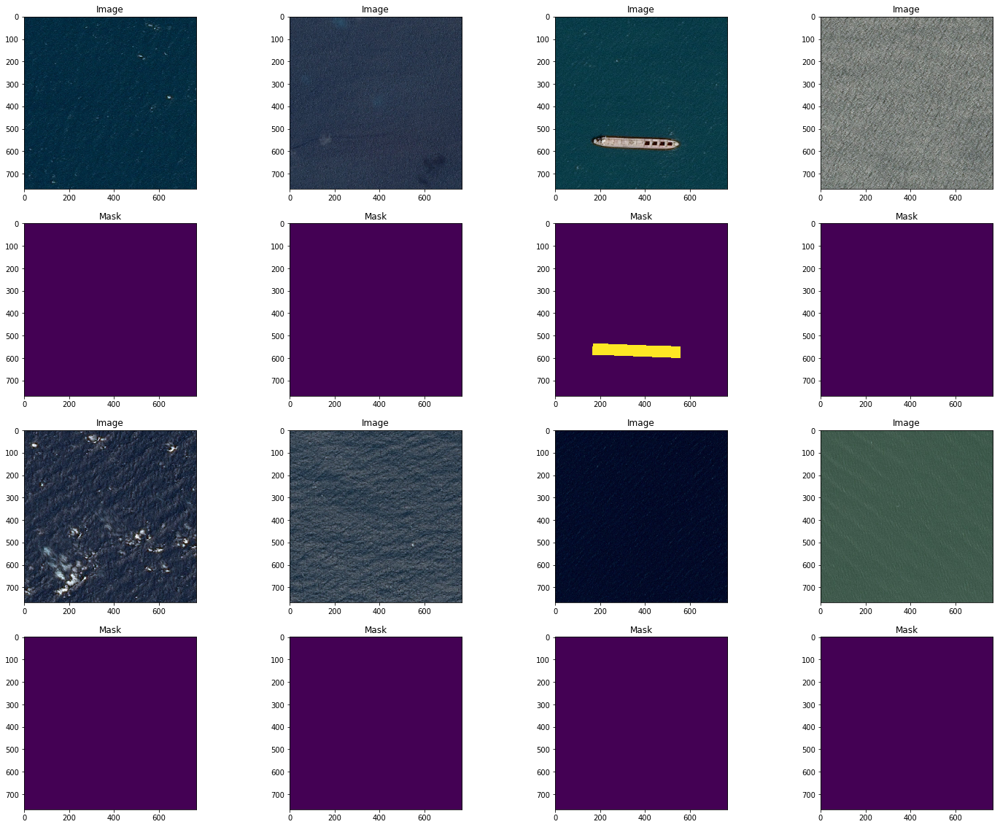

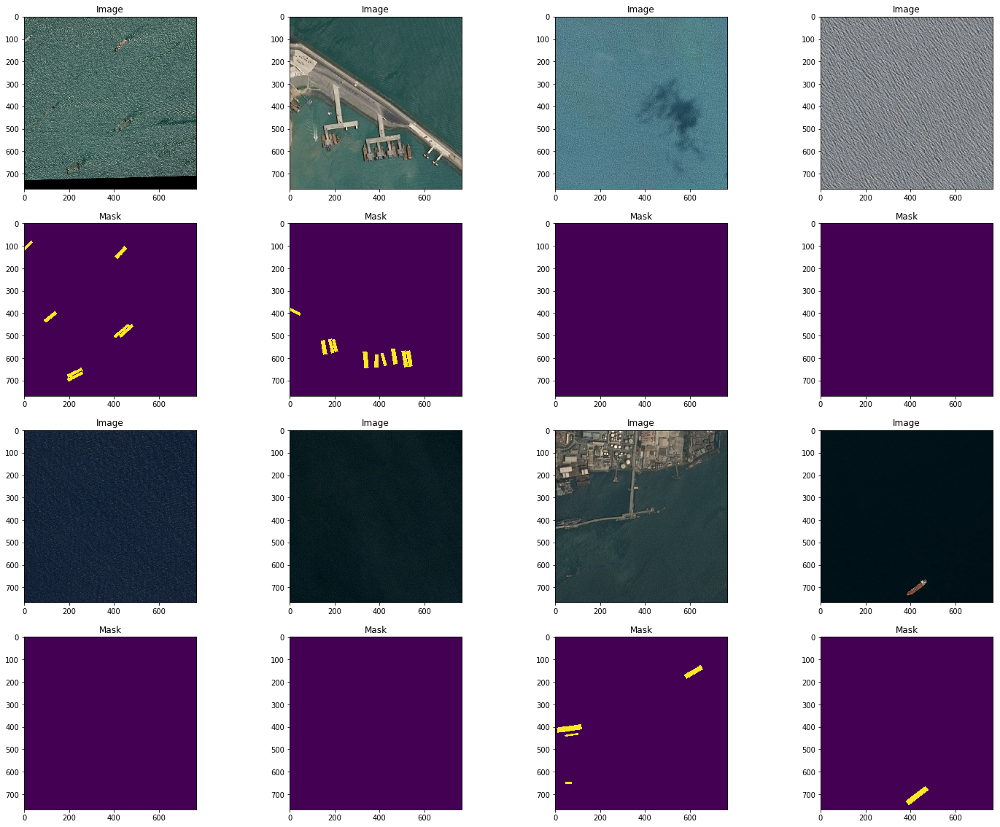

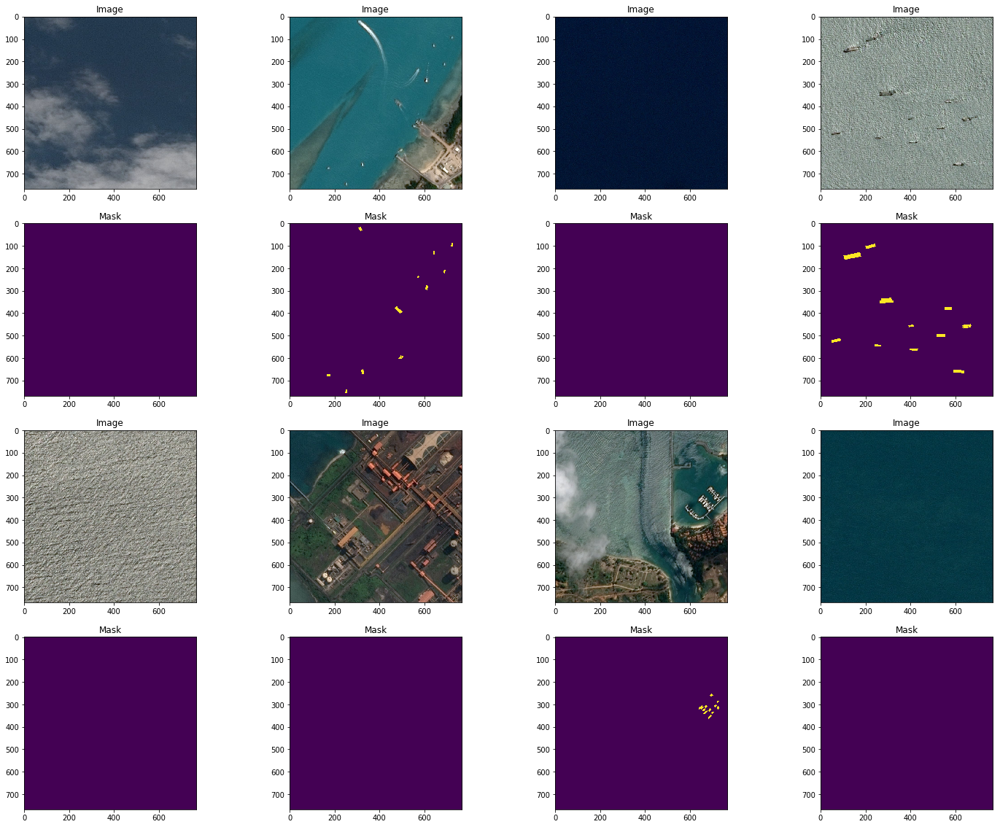

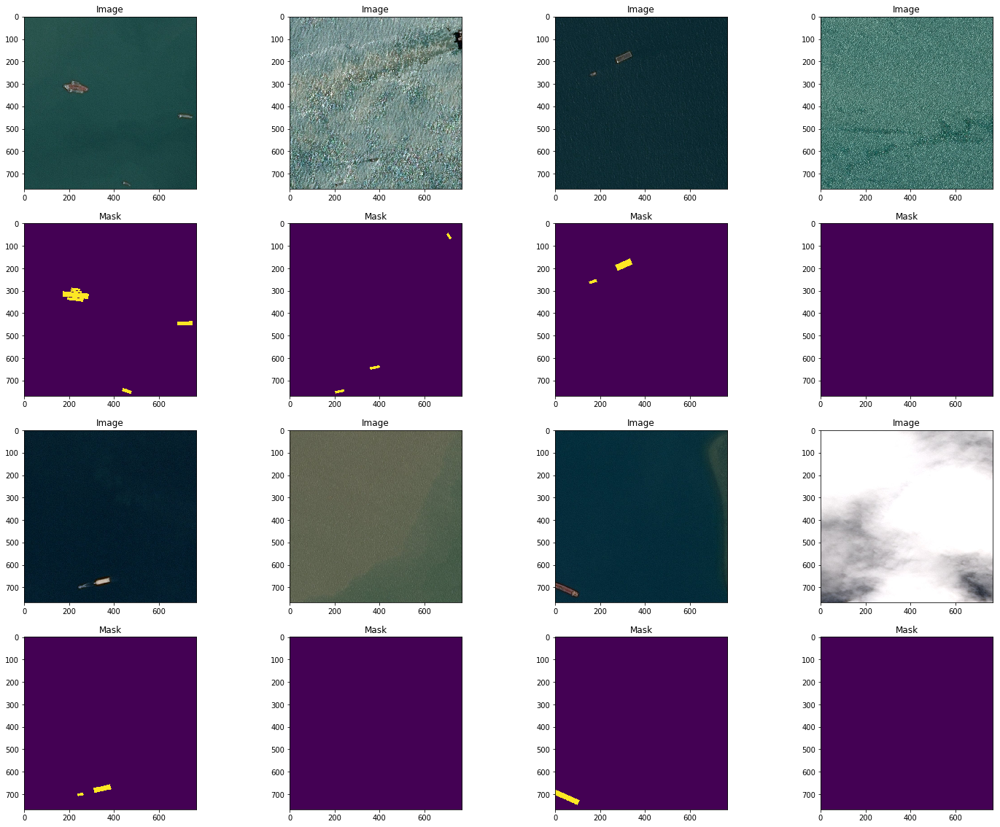

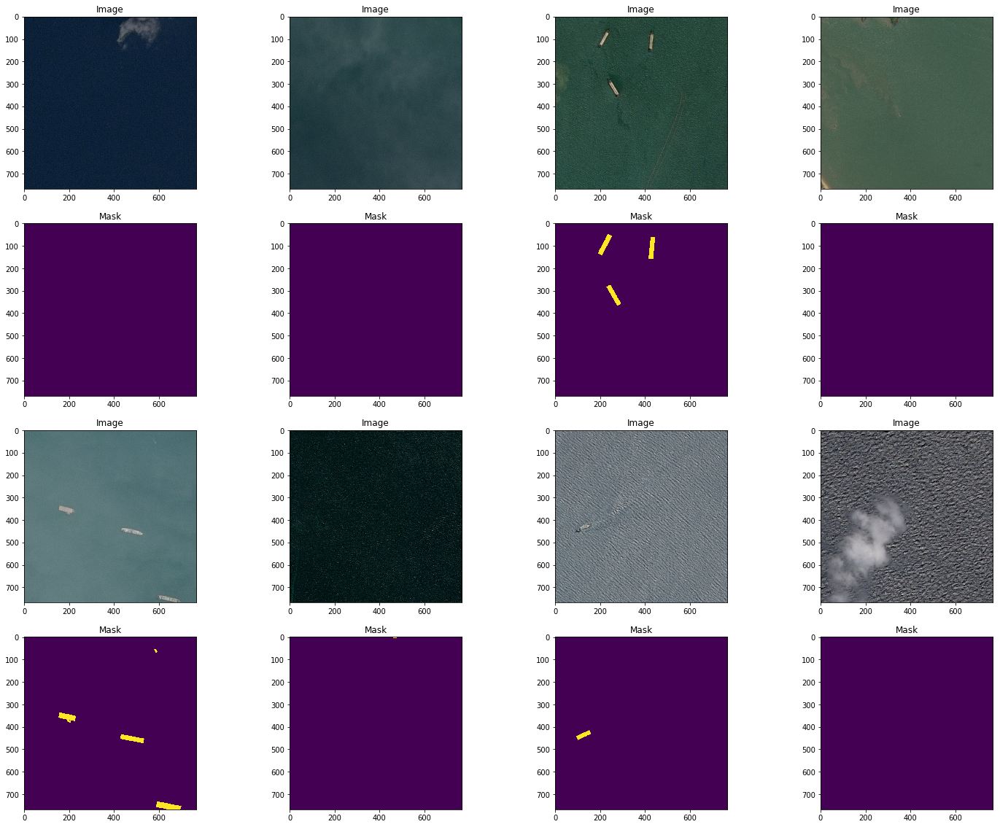

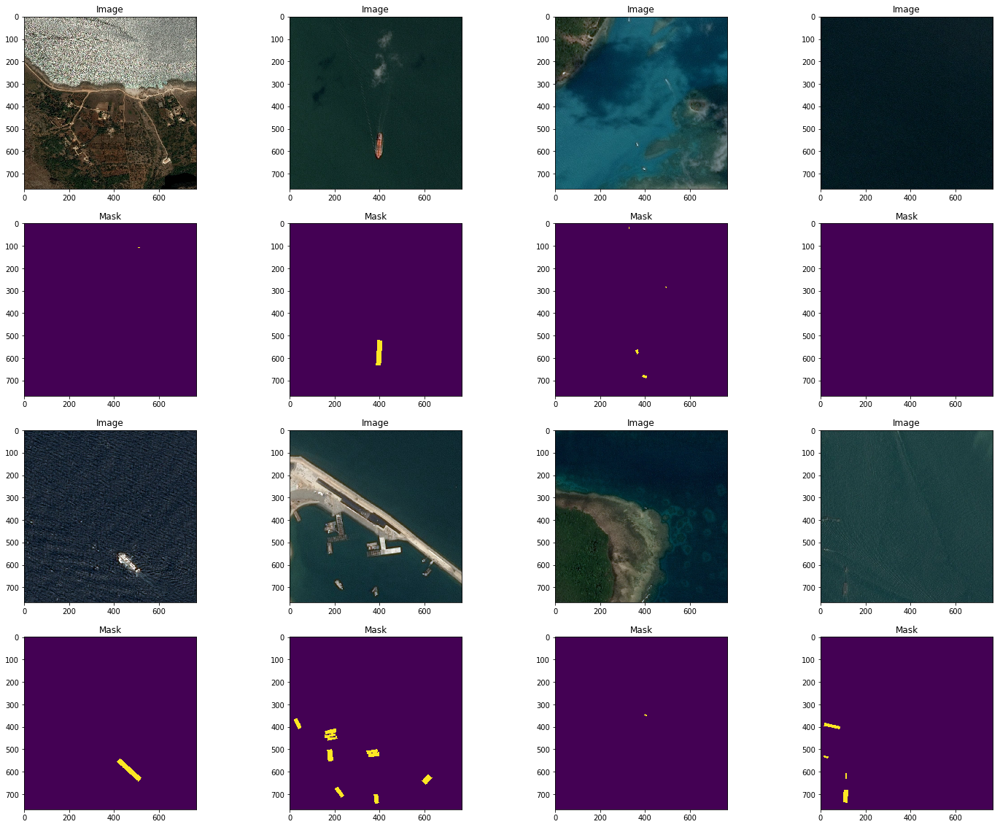

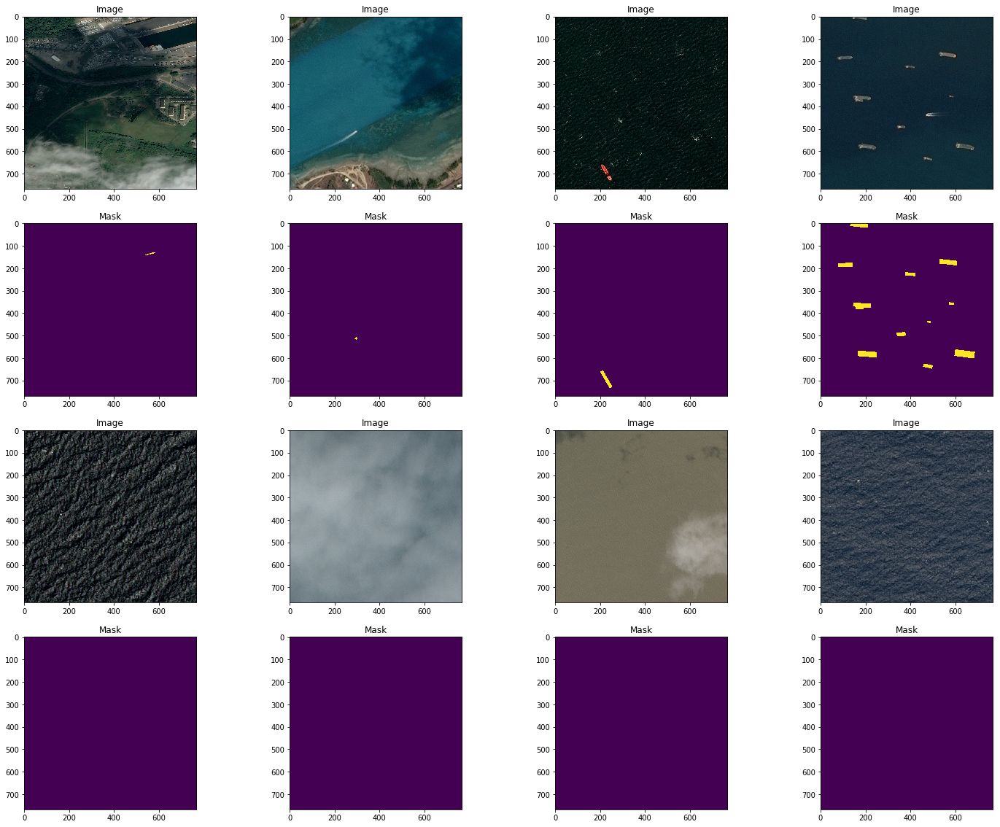

In [15]:
indices = np.random.choice(list(range(len(train_ids))), size=8)
plot_image_and_mask(indices)
indices = np.random.choice(list(range(len(train_ids))), size=8)
plot_image_and_mask(indices)
indices = np.random.choice(list(range(len(train_ids))), size=8)
plot_image_and_mask(indices)
indices = np.random.choice(list(range(len(train_ids))), size=8)
plot_image_and_mask(indices)
indices = np.random.choice(list(range(len(train_ids))), size=8)
plot_image_and_mask(indices)
indices = np.random.choice(list(range(len(train_ids))), size=8)
plot_image_and_mask(indices)
indices = np.random.choice(list(range(len(train_ids))), size=8)
plot_image_and_mask(indices)

## 3. Functions to create UNET network, train UNET network, and create submission csv

**Inspect the devices of kernel**

In [16]:
from tensorflow.python.client import device_lib
devices = device_lib.list_local_devices()
print(devices)

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 5060790447500589400
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 15864515789
locality {
  bus_id: 1
  links {
  }
}
incarnation: 13926163889270732482
physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"
]


In [17]:
if len(devices)>1:
    device = devices[1].name
else:
    device = devices[0].name

### 3.1 A function to create UNET network

In [18]:
def create_unet(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS,
                conv_filters, conv_transpose_filters, kernel_sizes, strides, 
                max_pool_kernel_size, max_pool_strides, learning_rate):
    
    '''
    A function to create UNET network
    '''
    cond = tf.placeholder(tf.int32, shape=(2,))
    # placeholder of input image
    X = tf.placeholder(tf.float32, [None, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS])
    # randomly flip up & down, left & right
    X = tf.cond(cond[0] > 0, lambda: tf.image.flip_up_down(X), lambda: X)
    X = tf.cond(cond[1] > 0, lambda: tf.image.flip_left_right(X), lambda: X)
    # placeholder of mask
    Y = tf.placeholder(tf.float32, [None, IMG_HEIGHT, IMG_WIDTH, 1])
    # randomly flip up & down, left & right
    Y = tf.cond(cond[0] > 0, lambda: tf.image.flip_up_down(Y), lambda: Y)
    Y = tf.cond(cond[1] > 0, lambda: tf.image.flip_left_right(Y), lambda: Y)
    # placeholder for mode of batch normalization
    training = tf.placeholder(tf.bool)
    # a list to store the convolutional layers
    convs = []
    
    print("########################Layers of UNET########################")
    
    # create convolutational layers of UNET using for loop
    for n, conv_filter in enumerate(conv_filters):
        # if it is the 1st convolutional layer
        if n == 0:
            with tf.device(device):
                # conv layer
                conv = tf.layers.conv2d(X, filters=conv_filter, kernel_size=kernel_sizes[n], 
                                        strides=[strides,strides],
                                        kernel_initializer=tf.variance_scaling_initializer(),
                                        padding="SAME")
                print(conv)
                # activation layer
                conv = tf.nn.elu(conv)
                print(conv)
                # append the layer to the designated list
                convs.append(conv)
                # max pooling layer
                conv = tf.layers.max_pooling2d(conv, max_pool_kernel_size, max_pool_strides, padding='SAME')
                print(conv)
        # for rest of the layers
        else:
            with tf.device(device):
                # conv layer
                conv = tf.layers.conv2d(conv, filters=conv_filter, kernel_size=kernel_sizes[n], 
                                        strides=[strides,strides],
                                        kernel_initializer=tf.variance_scaling_initializer(),
                                        padding="SAME")
                print(conv)
                # activation layer
                conv = tf.nn.elu(conv)
                print(conv)
                # append the layer to the designated list
                convs.append(conv)
                # max pooling layer
                conv = tf.layers.max_pooling2d(conv, max_pool_kernel_size, max_pool_strides, padding='SAME')
                print(conv)
    
    # create deconvolutational layers of UNET using for loop
    for n, conv_transpose_filter in enumerate(conv_transpose_filters):
        # if it is not the last layer
        if n != len(conv_transpose_filters)-1:
            with tf.device(device):
                # deconvolutional layer
                conv = tf.layers.conv2d_transpose(conv, filters=conv_transpose_filter, 
                                                  kernel_size=kernel_sizes[::-1][n],
                                                  kernel_initializer=tf.variance_scaling_initializer(),
                                                  strides=[2,2], padding="SAME")
                print(conv)
                # activation layer
                conv = tf.nn.elu(conv)
                print(conv)
                # concat the corresponding convolutional layer (this improves accuracy)
                conv = tf.concat((conv, convs[::-1][n]), axis=3)
                print(conv)
        # if it is the last layer
        else:
            with tf.device(device):
                # deconvolutional layer
                conv = tf.layers.conv2d_transpose(conv, filters=conv_transpose_filter, 
                                                  kernel_size=kernel_sizes[::-1][n],
                                                  kernel_initializer=tf.variance_scaling_initializer(),
                                                  strides=[2,2], padding="SAME")
                print(conv)
    
    print("#############################################################")
    
    with tf.device(device):
        # sigmoid of the last deconvolutional layer
        Y_ = tf.nn.sigmoid(conv)
        # flatten the mask
        flat_y = tf.layers.Flatten()(Y)
        # flatten the predicted mask
        flat_conv = tf.layers.Flatten()(conv)
    
    with tf.device(device): 
        # sigmoid_cross_entropy
        cost = tf.losses.sigmoid_cross_entropy(multi_class_labels=flat_y, logits=flat_conv)
        
    # optimizer
    optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate)
    
    with tf.device(device):
        # train step
        train_step = optimizer.minimize(cost)
        
    return X,Y,Y_,cond,cost,train_step

### 3.2 A function to train UNET network

In [19]:
def train_unet(max_iter,batch_size,
               X,Y,Y_,cond,cost,train_step,
               train_indices,train_ids, feed_dict_validation,
               TRAIN_IMG_DIR, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS,
               model_dir, model_name):    
    '''
    A function to traini UNET network
    '''    
    # start time
    start_time = time.time()
    # create a saver object
    saver = tf.train.Saver(max_to_keep=1)    
    # lists to store the train cost, validation cost
    train_cost = []
    valid_cost = []
    # variables to store the best cost and best iteration
    best_cost = 100
    best_iteration = None    
    # number of training data
    N = len(train_ids)    
    # number of complete batches
    num_complete_mini_batches = math.floor(N/batch_size)
    # path of model saver object
    model_path = model_dir+model_name

    # create a graph session and optimize the network under it
    with tf.Session() as sess:

        sess.run(tf.global_variables_initializer())
        
        # create an object of progress bar
        bar = progressbar.ProgressBar(maxval=max_iter, widgets=[
            '[',progressbar.Percentage(),']',
            progressbar.Bar(),
            '(',progressbar.DynamicMessage("train_cost"),')',
            '(',progressbar.DynamicMessage("valid_cost"),')',
            '(',progressbar.DynamicMessage("best_valid_cost"),')',
            '(',progressbar.DynamicMessage("time_elapsed"),'mins)'
        ])
        # start the progress bar
        bar.start()
        # counter variable to track the number of iterations
        counter = 0
        # iterate until maximum number of iterations is reached
        while True:            
            # break out of the inner for loop if maximum number of iterations is reached
            if counter>=max_iter:
                break
            # iterate through the mini batches
            for k in range(0, num_complete_mini_batches+1):
                # if the mini batch is a complete batch
                if k < num_complete_mini_batches:
                    batch_indices = train_indices[list(range(k * batch_size, k * batch_size + batch_size))]
                # handling the end case when the last mini batch is less than the batch_size
                elif N % batch_size != 0:
                    batch_indices = train_indices[list(range(num_complete_mini_batches * batch_size, N))]
                    
                # conditions for flip up & down and left & right
                conditions = np.random.choice([0,1], size=2)
                  
                try:
                    # generate images and masks for the batch 
                    image_batch, mask_batch = generate_batch(batch_indices, train_ids, 
                                                             TRAIN_IMG_DIR, IMG_HEIGHT,
                                                             IMG_WIDTH, IMG_CHANNELS, 
                                                             train_set = True)
                except:
                    counter += 1
                    continue
                
                # feed dict of the batch
                feed_dict_batch = {X: image_batch.astype(np.float32), 
                                   Y: mask_batch.astype(np.float32),
                                   cond: conditions}

                # execute optimization step
                sess.run(train_step, feed_dict=feed_dict_batch)

                # calculate temporary train cost and append it to the designated list
                temp_train_cost = cost.eval(session=sess, feed_dict=feed_dict_batch)
                train_cost.append(temp_train_cost)

                # calculate temporary validation cost and append it to the designated list
                temp_validation_cost = cost.eval(session=sess, feed_dict=feed_dict_validation)
                valid_cost.append(temp_validation_cost)

                # if valid cost is better than best recorded so far then
                # update the parameters of the best model and save the model
                if temp_validation_cost < best_cost:
                    best_cost = temp_validation_cost
                    best_iteration = counter+1          
                    saver.save(sess, model_path, global_step = best_iteration)
                    
                # compute running time from start point
                time_diff = (time.time()-start_time)/60
                # update the progress bar
                bar.update(counter+1, train_cost = temp_train_cost, valid_cost = temp_validation_cost, 
                           best_valid_cost = best_cost, time_elapsed = time_diff)
                # increment counter variable
                counter += 1
                # break out of the inner for loop if maximum number of iterations is reached
                if counter>=max_iter:
                    break        
        # finish the progress bar
        bar.finish()
            
    return saver, train_cost, valid_cost, best_cost, best_iteration

### 3.3 A function to create predictions and submission file****

In [20]:
def create_predictions(model_path, X, Y_, test_ids, n_folds, 
                       threshold, submission_dir, submission_file):    
    '''
    A function to create predictions and submission file
    '''
    submission_path = submission_dir + submission_file
    
    with tf.Session() as sess:        
        # restore the best model
        saver.restore(sess, model_path)
        # number of test samples
        n = len(test_ids)
        # step size of each fold
        step = n//n_folds
        # a list to store the encoded pixels 
        EncodedPixels = []
        # create a progress bar object
        bar = progressbar.ProgressBar(maxval=n_folds, widgets=[
                        '[',progressbar.Percentage(),']',
                        progressbar.Bar(),
                        '(',progressbar.DynamicMessage("number_of_folds_completed"),')'
                    ])
        # start progress bat
        bar.start()
        # iterate through each fold
        for i in range(n_folds): 
            # start and end indices of the fold
            if i != (n_folds-1):
                start = (step*i)
                end = (step*(i+1)) 
            else:
                start = (step*i)
                end = len(test_ids)

            # create array of indices
            indices = list(range(start, end))
            indices = np.array(indices)
            # generate batch of test data
            image_test_batch = generate_batch(indices, test_ids, 
                                              TEST_IMG_DIR, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, 
                                              train_set = False)            
            # feed dict
            feed_dict_test =  {X: image_test_batch.astype(np.float32)}
            # predicted mask
            mask_predicted = sess.run(Y_, feed_dict=feed_dict_test)
            del(feed_dict_test, image_test_batch)
            # binirize mask
            mask_predicted = binirize_mask(mask_predicted, threshold=threshold)
            # encode masks
            EncodedPixels = rle_encode_multimage(mask_predicted)
            del(mask_predicted)            
            #  save the predictions to the designated csv file
            if i == 0:
                submission = pd.DataFrame({"ImageId":test_ids[indices],"EncodedPixels": EncodedPixels},
                                          columns=["ImageId","EncodedPixels" ])
                submission.to_csv(submission_path, header = True, index=False)
            else:
                submission = pd.DataFrame({"ImageId":test_ids[indices],"EncodedPixels": EncodedPixels},
                                          columns=["ImageId","EncodedPixels" ])
                submission.to_csv(submission_path, mode='a', header = False, index=False) 
            # update the progress bar
            bar.update(i+1, number_of_folds_completed = i+1)            
        # finish the progress bar
        bar.finish()

## 4. Create and train UNET network

**Create train and validation indices**

In [21]:
train_indices = np.random.choice(len(train_ids), round(len(train_ids)*0.99907), replace=False)
validation_indices = np.array(list(set(range(len(train_ids))) - set(train_indices)))
print("Size of train set:", len(train_indices))
print("Size of validation set:", len(validation_indices))

Size of train set: 163294
Size of validation set: 152


**Reset trensorflow graph**

In [22]:
tf.reset_default_graph()

**Create UNET**

In [23]:
kernel_sizes = [7,7,7,5,5]
conv_filters = [8,16,32,64]
strides = 1
max_pool_kernel_size = 2
max_pool_strides = 2
conv_transpose_filters = [64,32,16,1]
learning_rate=0.0001*3
batch_size = 100
max_iter = 1400
X,Y,Y_,cond,cost,train_step = \
create_unet(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS,
            conv_filters, conv_transpose_filters, kernel_sizes, strides,
            max_pool_kernel_size, max_pool_strides, learning_rate)

########################Layers of UNET########################
Tensor("conv2d/BiasAdd:0", shape=(?, 768, 768, 8), dtype=float32, device=/device:GPU:0)
Tensor("Elu:0", shape=(?, 768, 768, 8), dtype=float32, device=/device:GPU:0)
Tensor("max_pooling2d/MaxPool:0", shape=(?, 384, 384, 8), dtype=float32, device=/device:GPU:0)
Tensor("conv2d_1/BiasAdd:0", shape=(?, 384, 384, 16), dtype=float32, device=/device:GPU:0)
Tensor("Elu_1:0", shape=(?, 384, 384, 16), dtype=float32, device=/device:GPU:0)
Tensor("max_pooling2d_1/MaxPool:0", shape=(?, 192, 192, 16), dtype=float32, device=/device:GPU:0)
Tensor("conv2d_2/BiasAdd:0", shape=(?, 192, 192, 32), dtype=float32, device=/device:GPU:0)
Tensor("Elu_2:0", shape=(?, 192, 192, 32), dtype=float32, device=/device:GPU:0)
Tensor("max_pooling2d_2/MaxPool:0", shape=(?, 96, 96, 32), dtype=float32, device=/device:GPU:0)
Tensor("conv2d_3/BiasAdd:0", shape=(?, 96, 96, 64), dtype=float32, device=/device:GPU:0)
Tensor("Elu_3:0", shape=(?, 96, 96, 64), dtype=float

**Train UNET**

In [24]:
# image and mask for validation set
image_validation, mask_validation =  generate_batch(validation_indices, train_ids, 
                                                    TRAIN_IMG_DIR, IMG_HEIGHT, 
                                                    IMG_WIDTH, IMG_CHANNELS, 
                                                    train_set=True)
# feed dict for validation set
feed_dict_validation = {X: image_validation.astype(np.float32), 
                        Y: mask_validation.astype(np.float32)}

model_name = 'my-model'
saver, train_cost, valid_cost, best_cost, best_iteration = \
train_unet(max_iter,batch_size,
           X,Y,Y_,cond,cost,train_step,
           train_indices,train_ids, feed_dict_validation,
           TRAIN_IMG_DIR, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS,
           model_dir, model_name)

[100%]||(train_cost: 0.00957)(valid_cost: 0.0101)(best_valid_cost: 0.00928)(time_elapsed:    316mins))


**Plot of Cost vs Iterations**

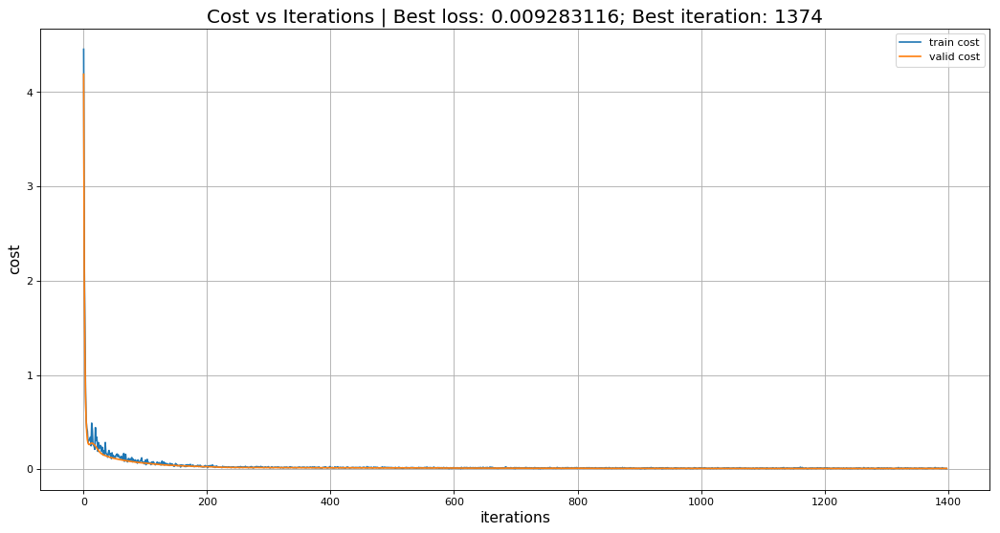

<Figure size 1800x1440 with 0 Axes>

In [25]:
plt.figure(figsize=(16, 8), dpi= 80, facecolor='w', edgecolor='k')
plt.plot(train_cost, label = 'train cost')
plt.plot(valid_cost, label = 'valid cost')
plt.xlabel('iterations', fontsize = 14)
plt.ylabel('cost', fontsize = 14)
plt.title("Cost vs Iterations | "+"Best loss: "+str(best_cost)+\
          "; Best iteration: "+str(best_iteration),fontsize = 18)
plt.legend()
plt.grid()
plt.show()
# save the figure in the designated directory
plt.savefig(figure_dir + 'cost_vs_iterations.png', bbox_inches='tight')

## 5. Inspect and choose threshold for binarization of predicted masks

**Compute predicted masks for validation set**

In [26]:
with tf.Session() as sess:
    # restore the best model
    model_path = model_dir+model_name+"-"+str(best_iteration)
    saver.restore(sess, model_path)
    # compute the predicted mask of the validation set
    mask_predicted = sess.run(Y_, feed_dict=feed_dict_validation)

INFO:tensorflow:Restoring parameters from ./model_files/my-model-1374


### 5.1 A function to plot masks and corresponding predicted masks

In [27]:
def plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices,treshold):
    
    mask_predicted_squeezed = np.squeeze(mask_predicted[indices])
    mask_validation_squeezed = np.squeeze(mask_validation[indices].astype(np.float32))
    mask_predicted_squeezed = binirize_mask(mask_predicted_squeezed, threshold = treshold)
    
    print("Threshold:", treshold)
    
    matplotlib.rcParams['figure.figsize'] = (25.0, 20.0)
    plt.subplot(4,4,1)
    plt.title("Original Mask")
    plt.imshow(mask_validation_squeezed[0])
    plt.subplot(4,4,1+4)
    plt.title("Predicted Mask")
    plt.imshow(mask_predicted_squeezed[0])
    plt.subplot(4,4,2)
    plt.title("Original Mask")
    plt.imshow(mask_validation_squeezed[1])
    plt.subplot(4,4,2+4)
    plt.title("Predicted Mask")
    plt.imshow(mask_predicted_squeezed[1].astype(np.uint8))
    plt.subplot(4,4,3)
    plt.title("Original Mask")
    plt.imshow(mask_validation_squeezed[2].astype(np.uint8))
    plt.subplot(4,4,3+4)
    plt.title("Predicted Mask")
    plt.imshow(mask_predicted_squeezed[2].astype(np.uint8))
    plt.subplot(4,4,4)
    plt.title("Original Mask")
    plt.imshow(mask_validation_squeezed[3].astype(np.uint8))
    plt.subplot(4,4,4+4)
    plt.title("Predicted Mask")
    plt.imshow(mask_predicted_squeezed[3].astype(np.uint8))
    plt.subplot(4,4,9)
    plt.title("Original Mask")
    plt.imshow(mask_validation_squeezed[4].astype(np.uint8))
    plt.subplot(4,4,1+12)
    plt.title("Predicted Mask")
    plt.imshow(mask_predicted_squeezed[4].astype(np.uint8))
    plt.subplot(4,4,10)
    plt.title("Original Mask")
    plt.imshow(mask_validation_squeezed[5].astype(np.uint8))
    plt.subplot(4,4,2+12)
    plt.title("Predicted Mask")
    plt.imshow(mask_predicted_squeezed[5].astype(np.uint8))
    plt.subplot(4,4,11)
    plt.title("Original Mask")
    plt.imshow(mask_validation_squeezed[6].astype(np.uint8))
    plt.subplot(4,4,3+12)
    plt.title("Predicted Mask")
    plt.imshow(mask_predicted_squeezed[6].astype(np.uint8))
    plt.subplot(4,4,12)
    plt.title("Original Mask")
    plt.imshow(mask_validation_squeezed[7].astype(np.uint8))
    plt.subplot(4,4,4+12)
    plt.title("Predicted Mask")
    plt.imshow(mask_predicted_squeezed[7].astype(np.uint8))
    plt.show()

### 5.2 Set indices of the validatation set and plot masks and corresponding predicted masks

Threshold: 0.1


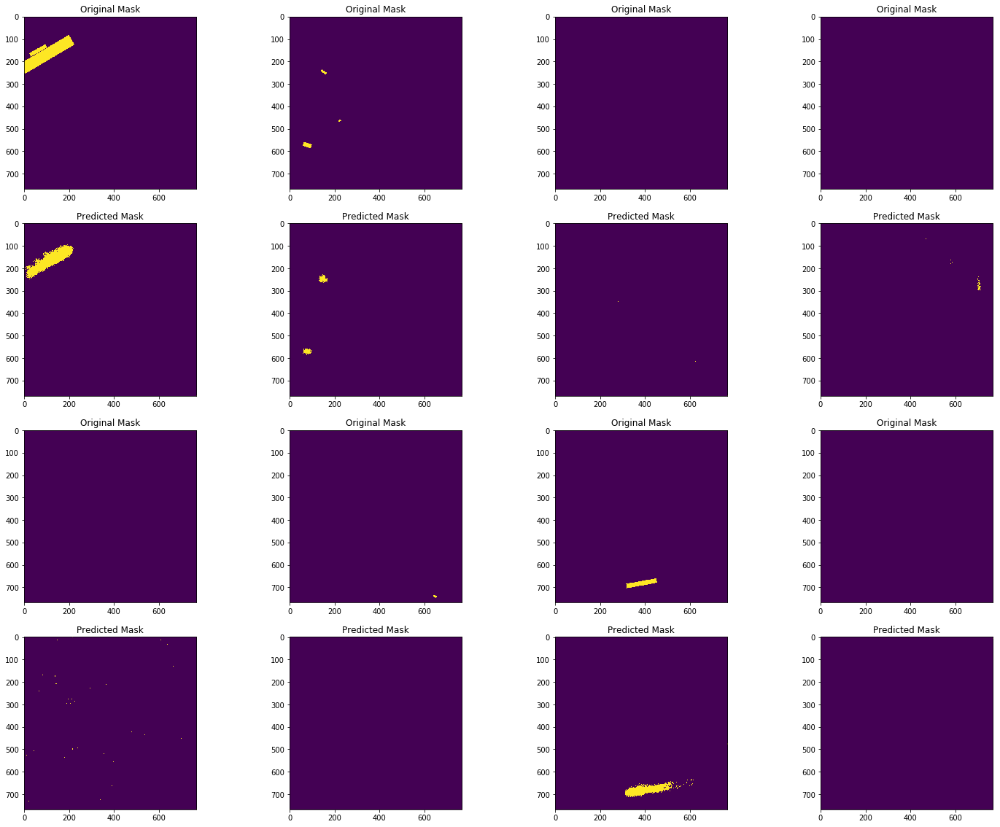

Threshold: 0.15


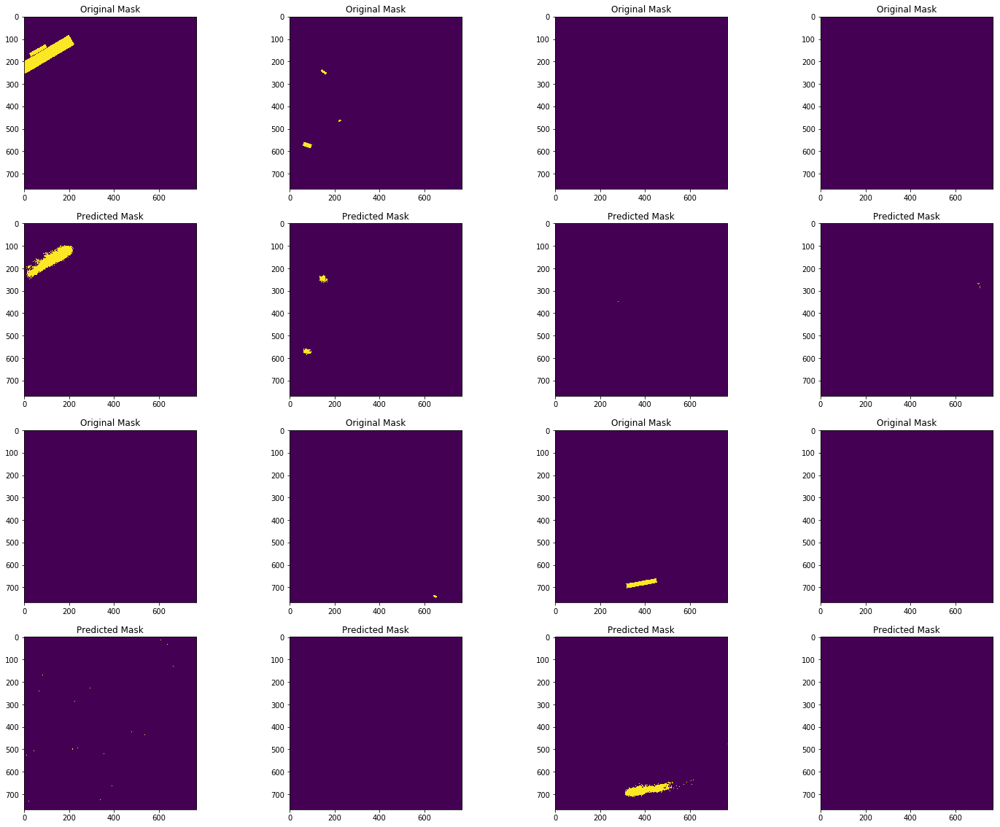

Threshold: 0.2


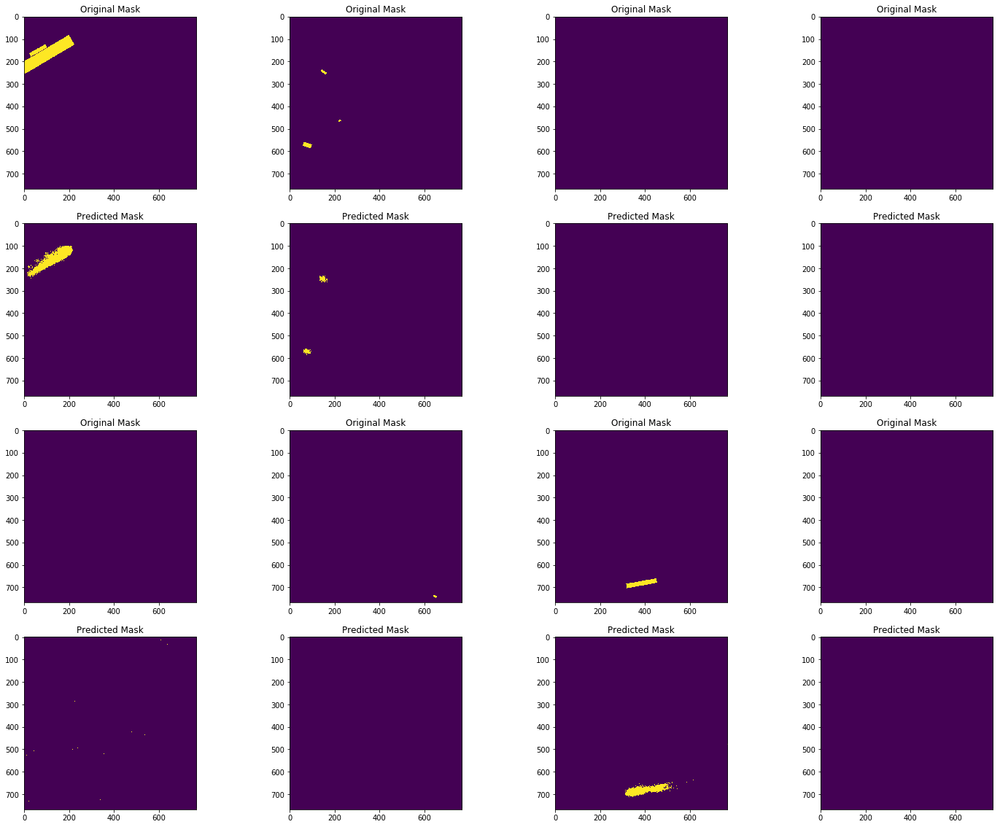

Threshold: 0.25


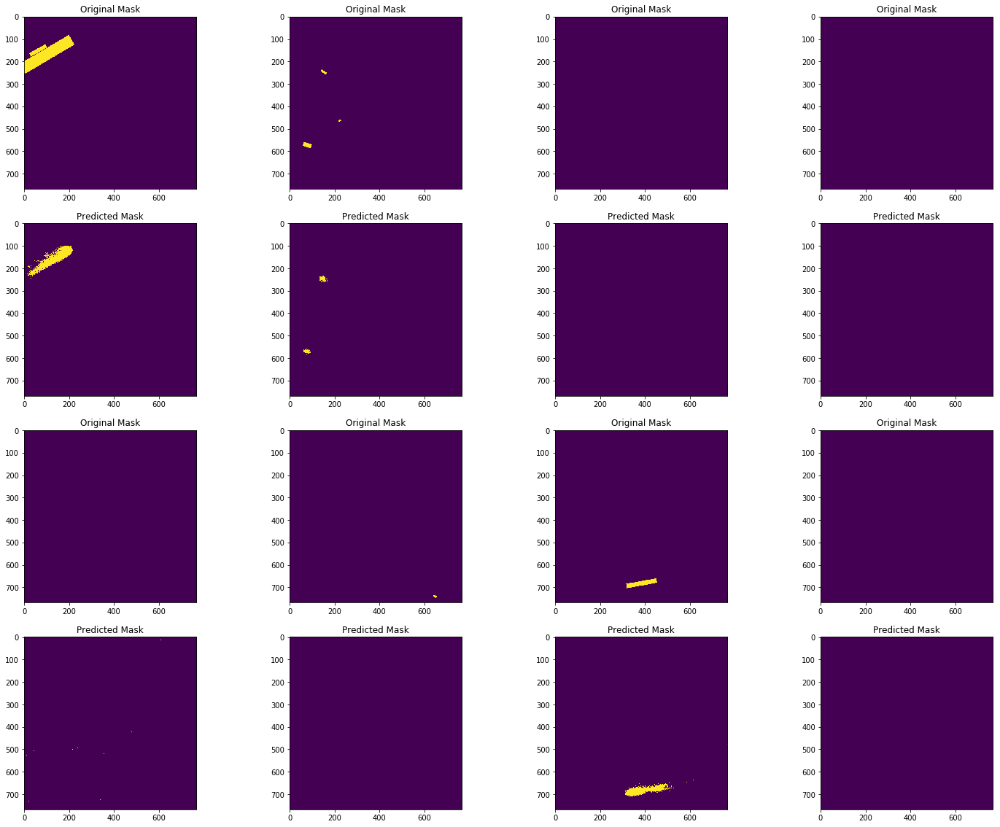

Threshold: 0.3


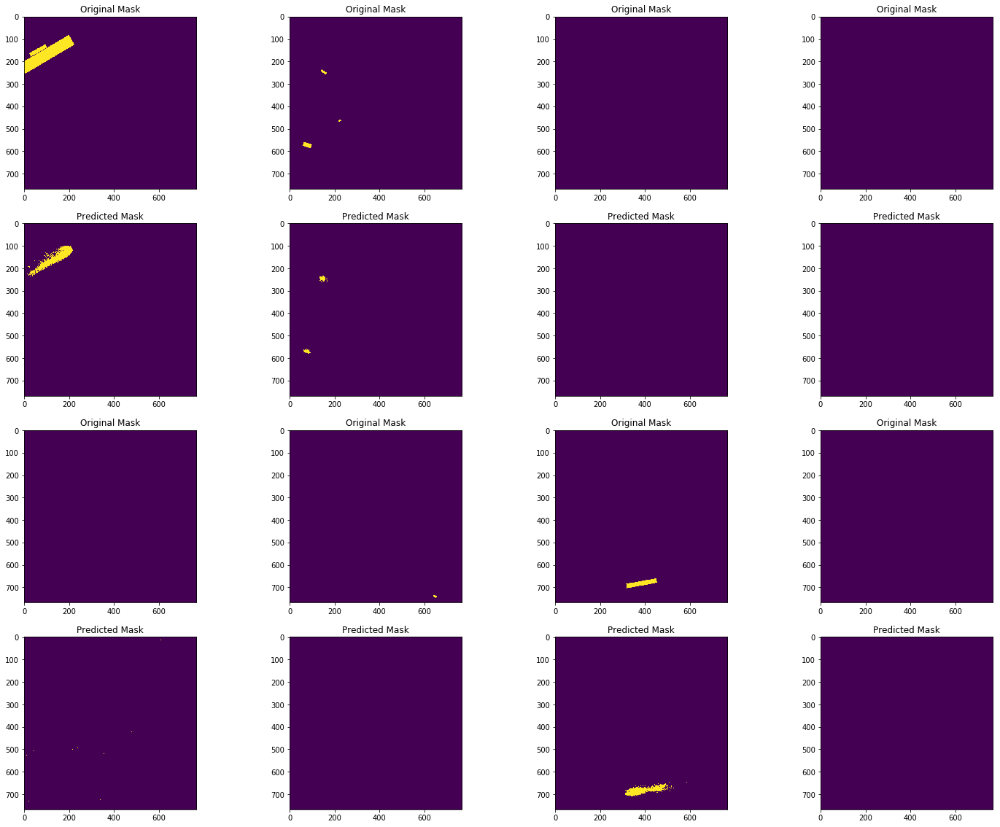

Threshold: 0.35


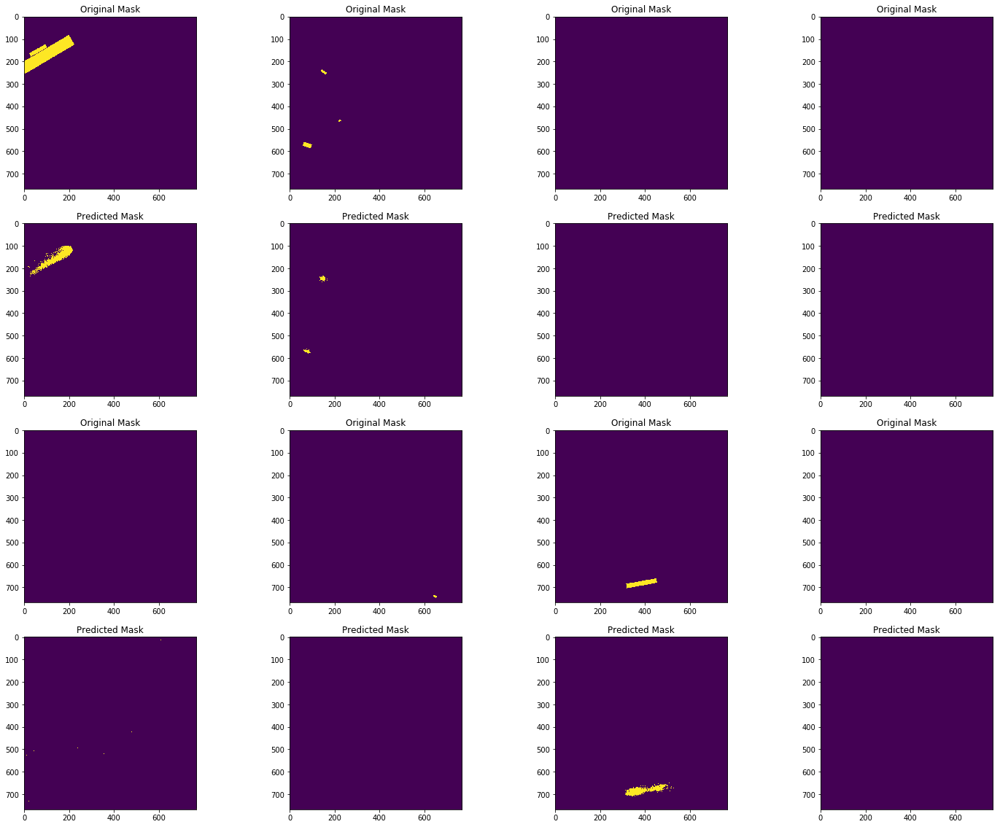

Threshold: 0.4


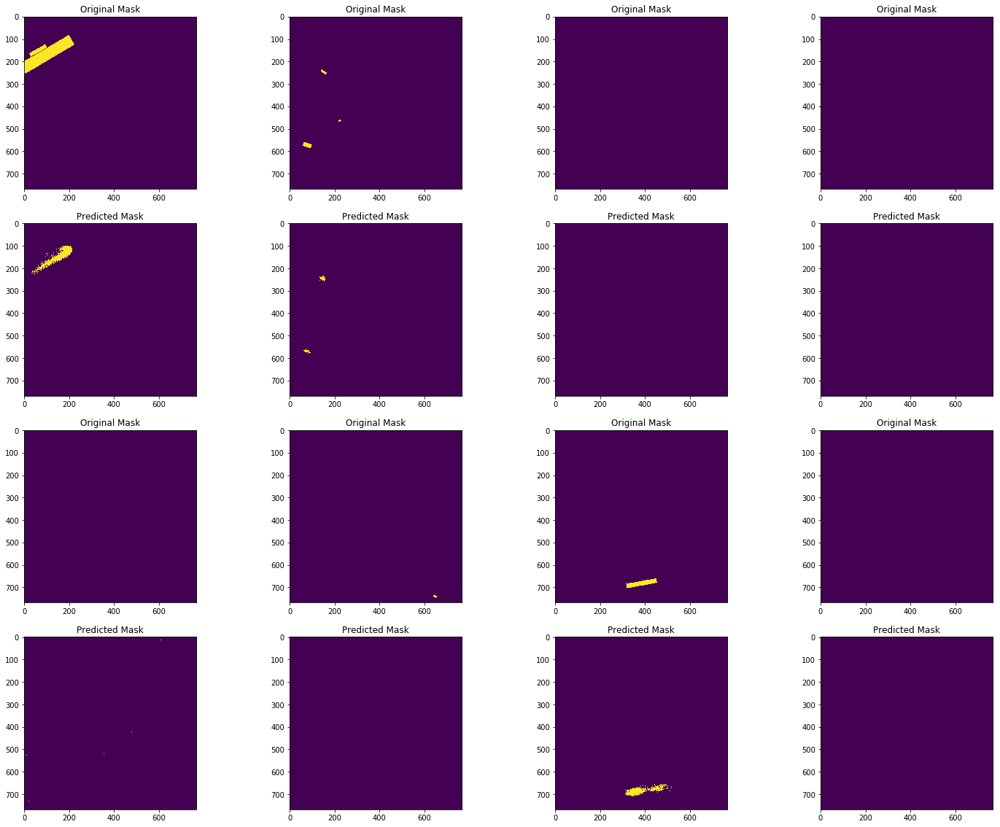

Threshold: 0.45


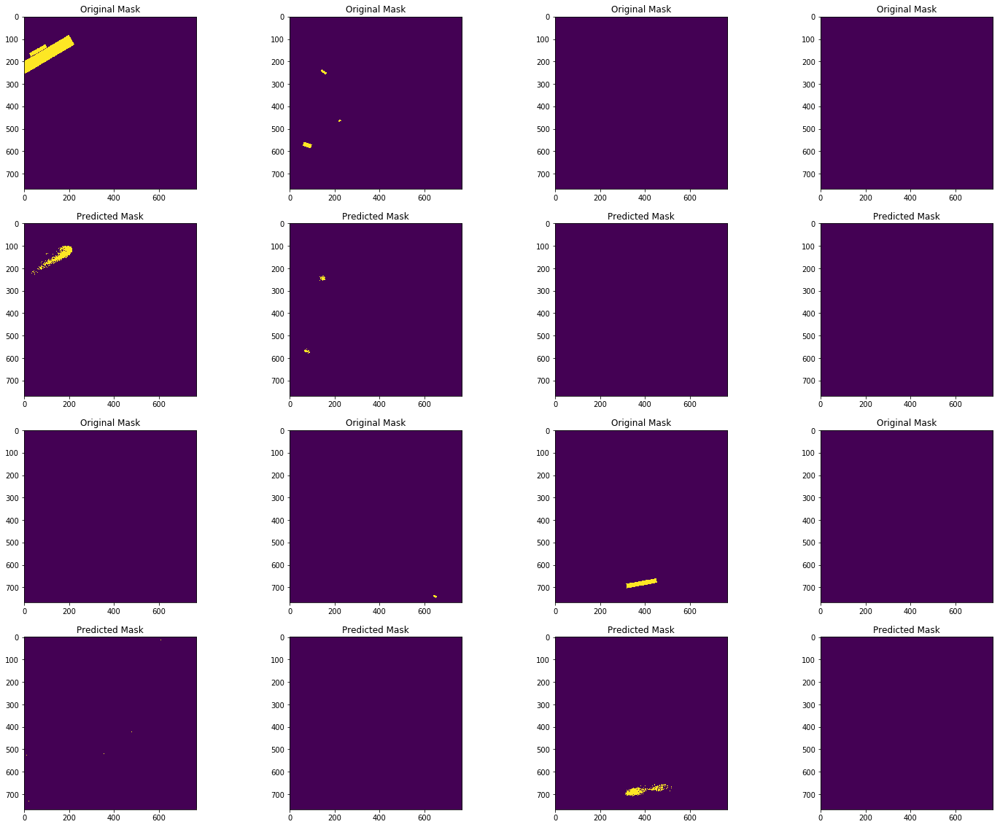

In [28]:
indices = np.array(list(range(0,8)))
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.1)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.15)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.2)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.25)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.3)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.35)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.4)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.45)

Threshold: 0.1


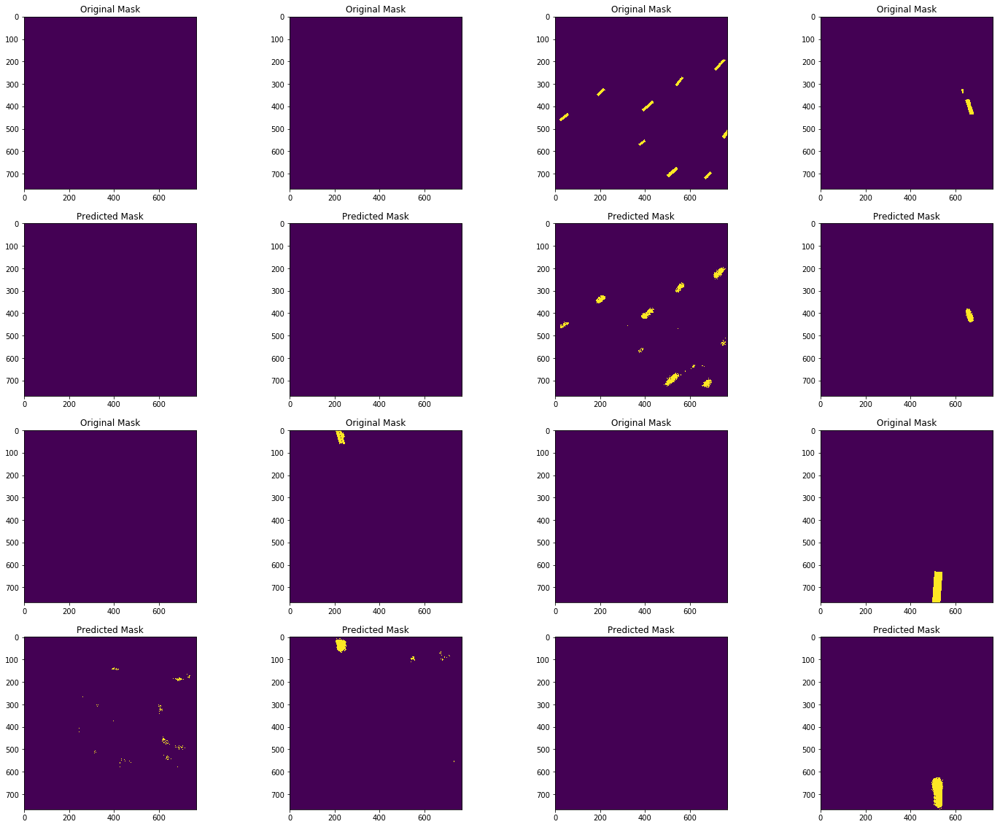

Threshold: 0.15


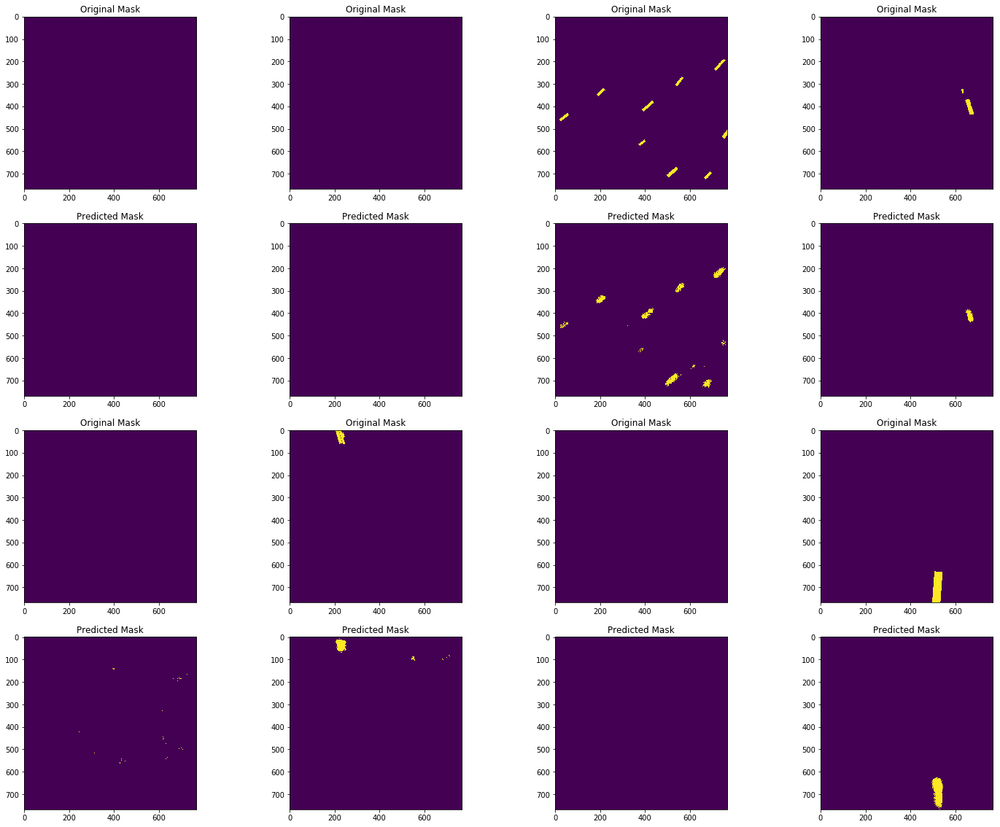

Threshold: 0.2


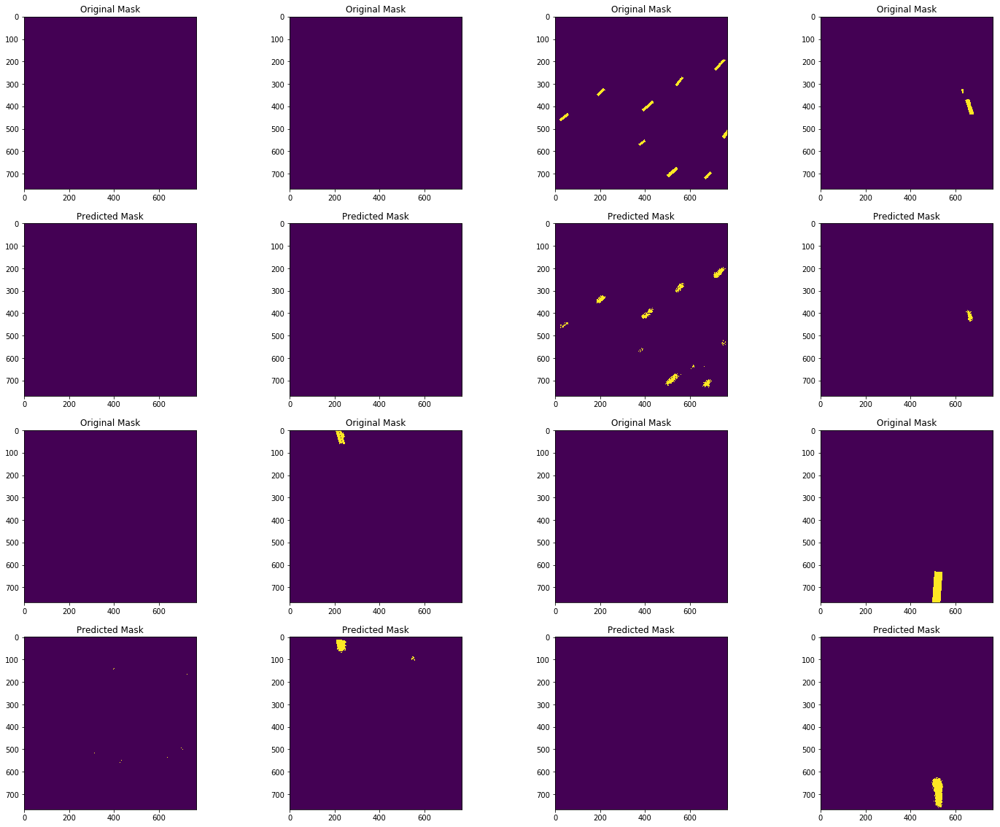

Threshold: 0.25


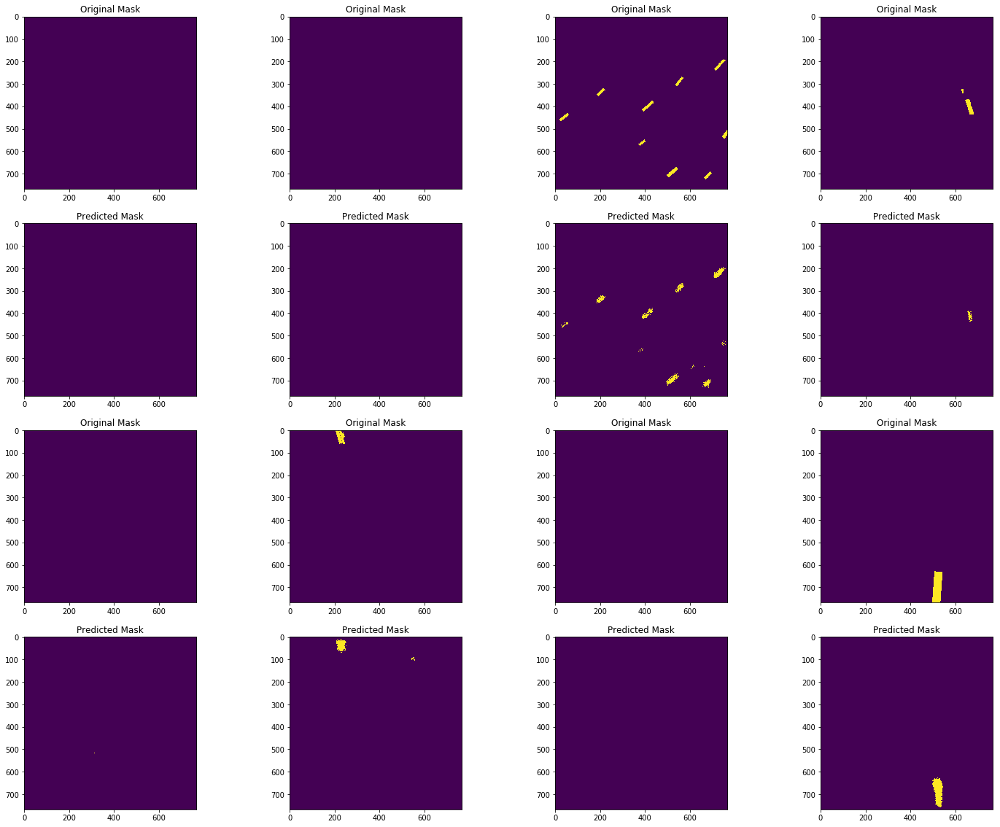

Threshold: 0.3


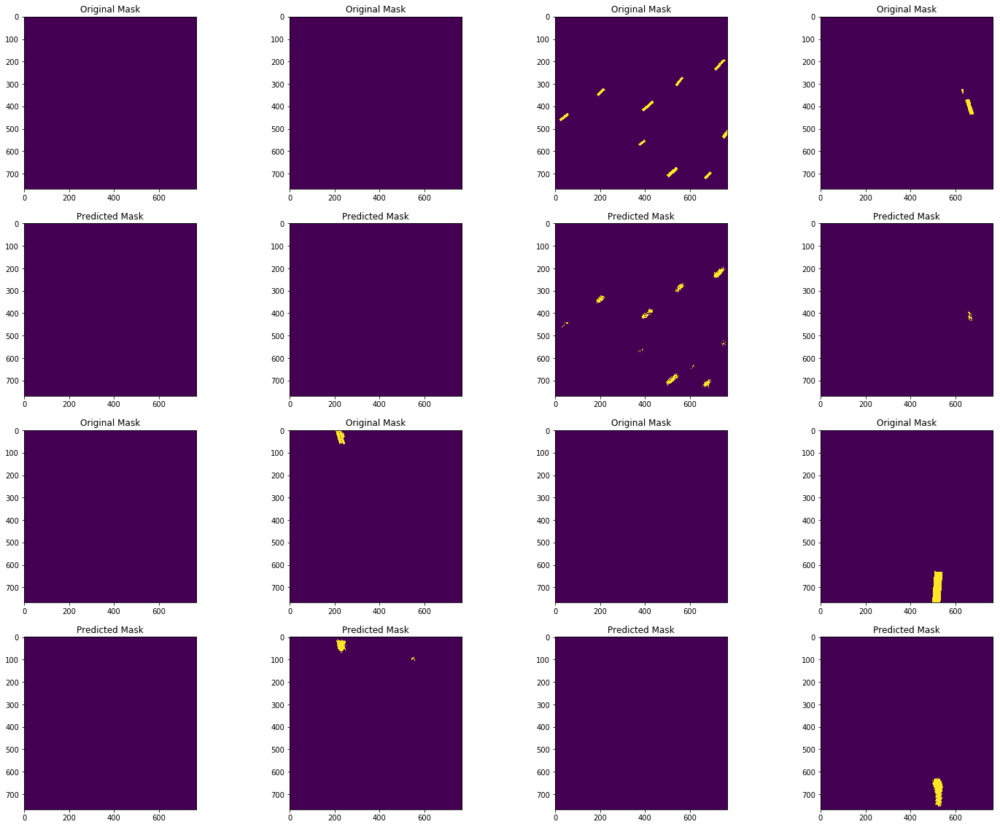

Threshold: 0.35


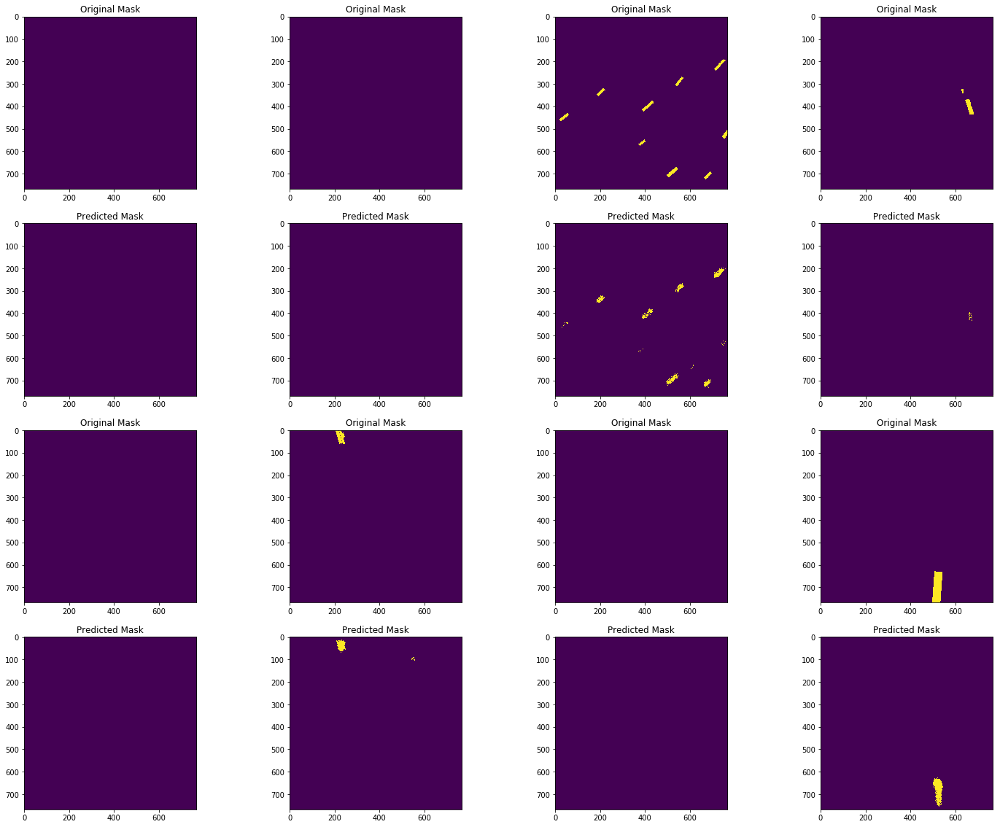

Threshold: 0.4


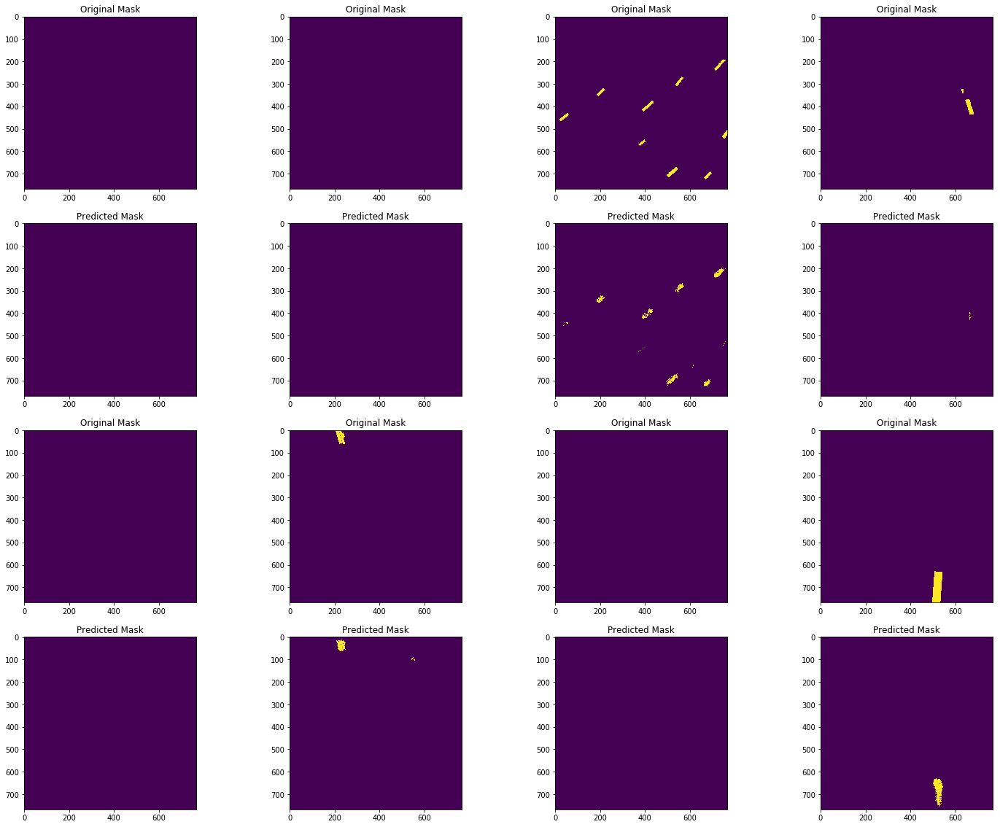

Threshold: 0.45


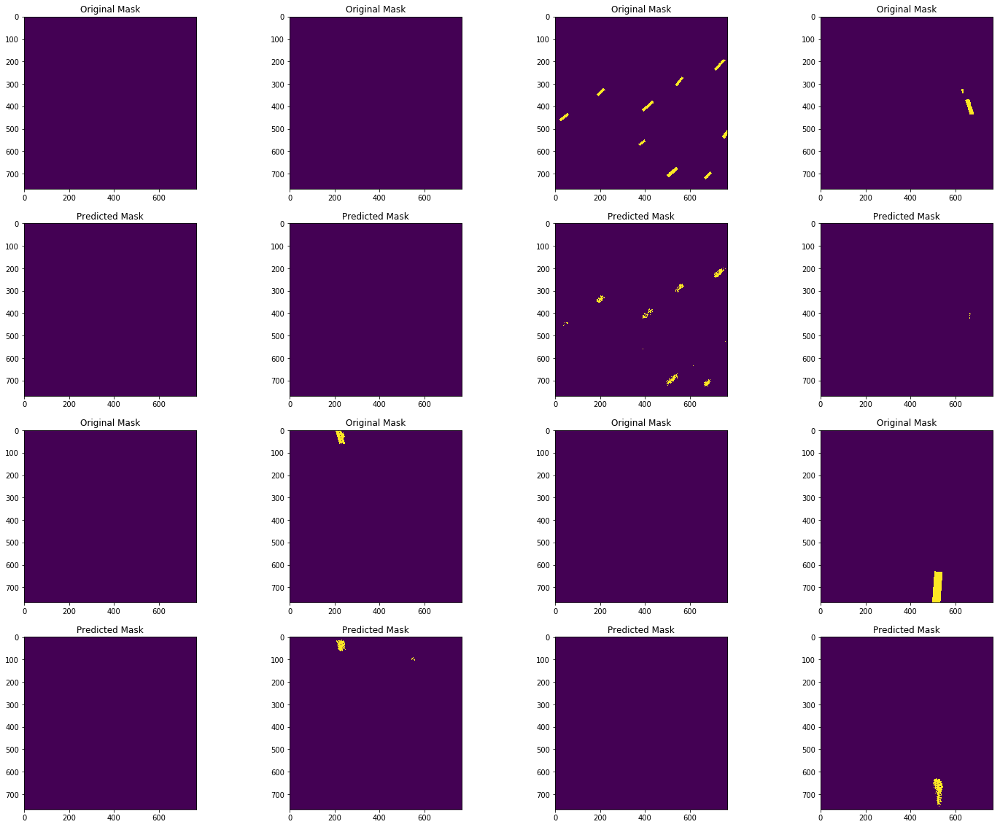

In [30]:
indices = np.array(list(range(8,16)))
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.1)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.15)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.2)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.25)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.3)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.35)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.4)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.45)

Threshold: 0.1


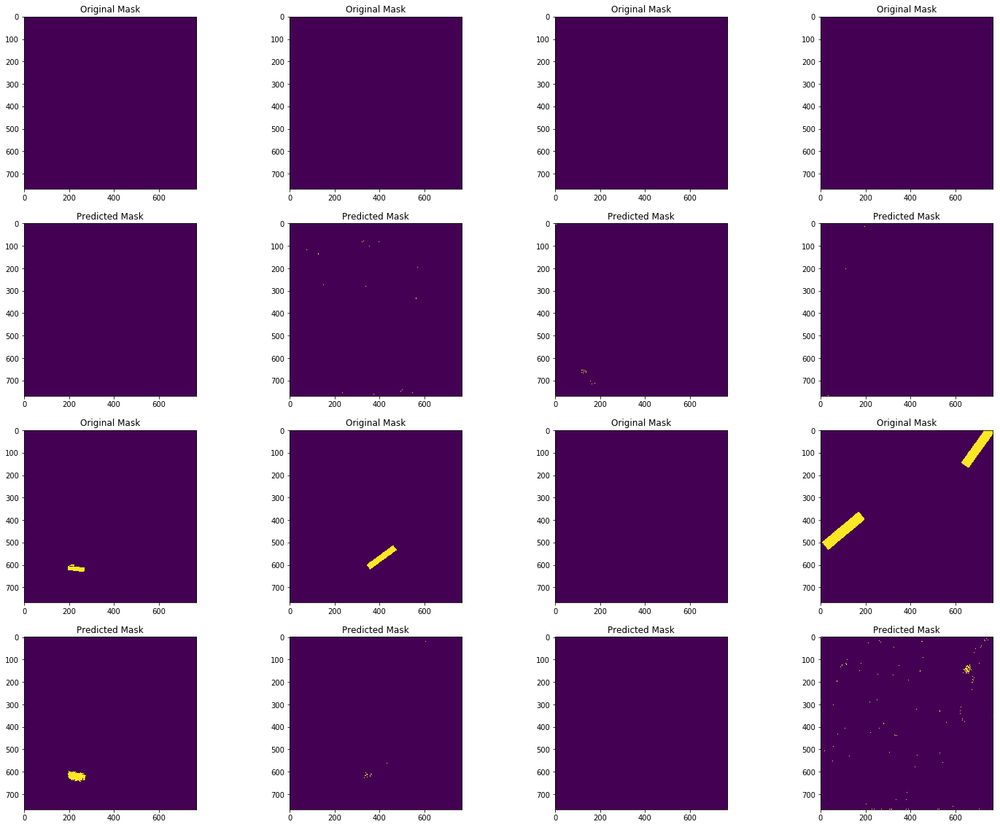

Threshold: 0.15


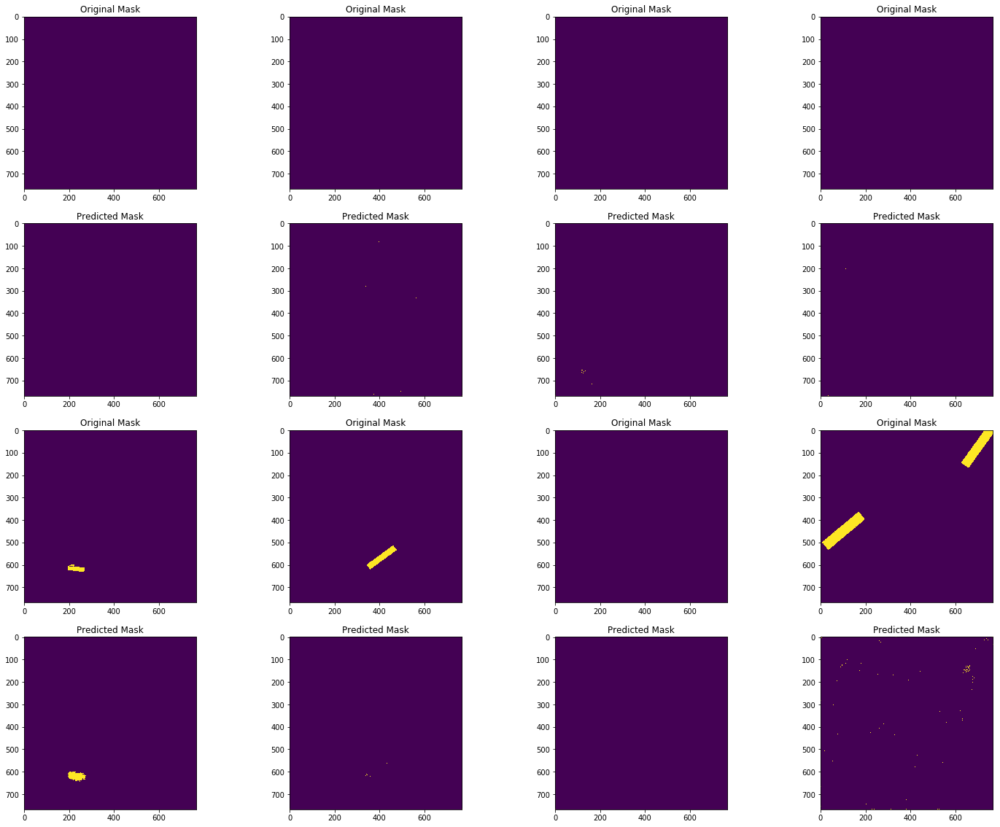

Threshold: 0.2


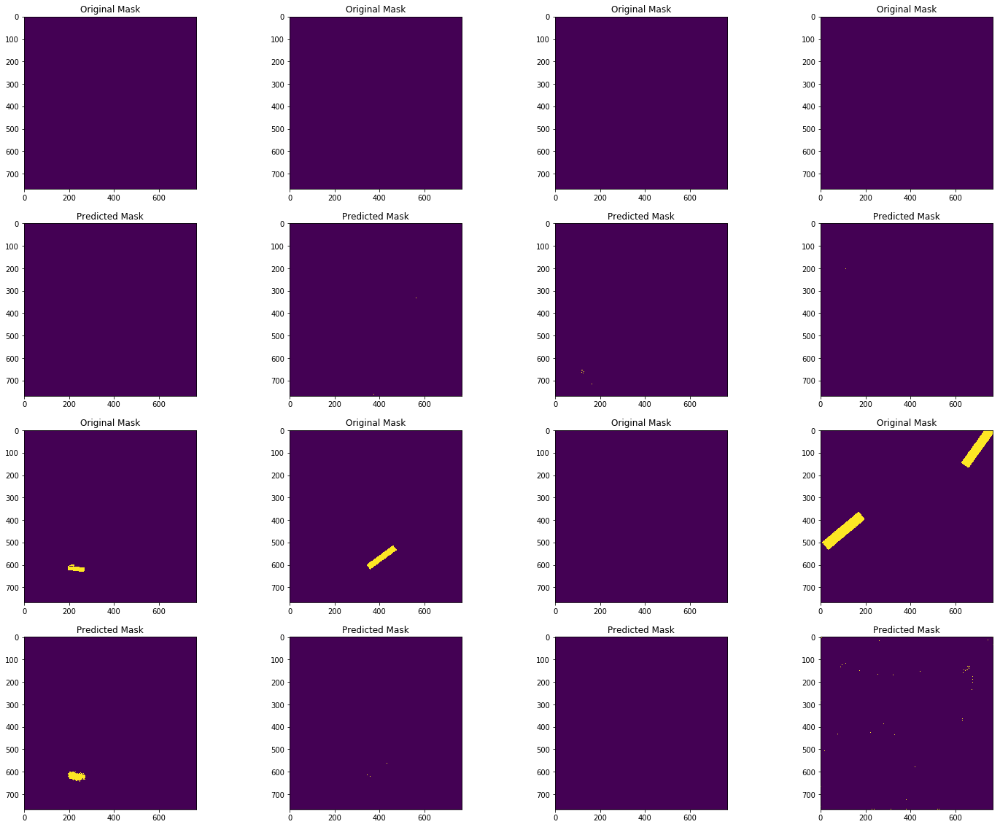

Threshold: 0.25


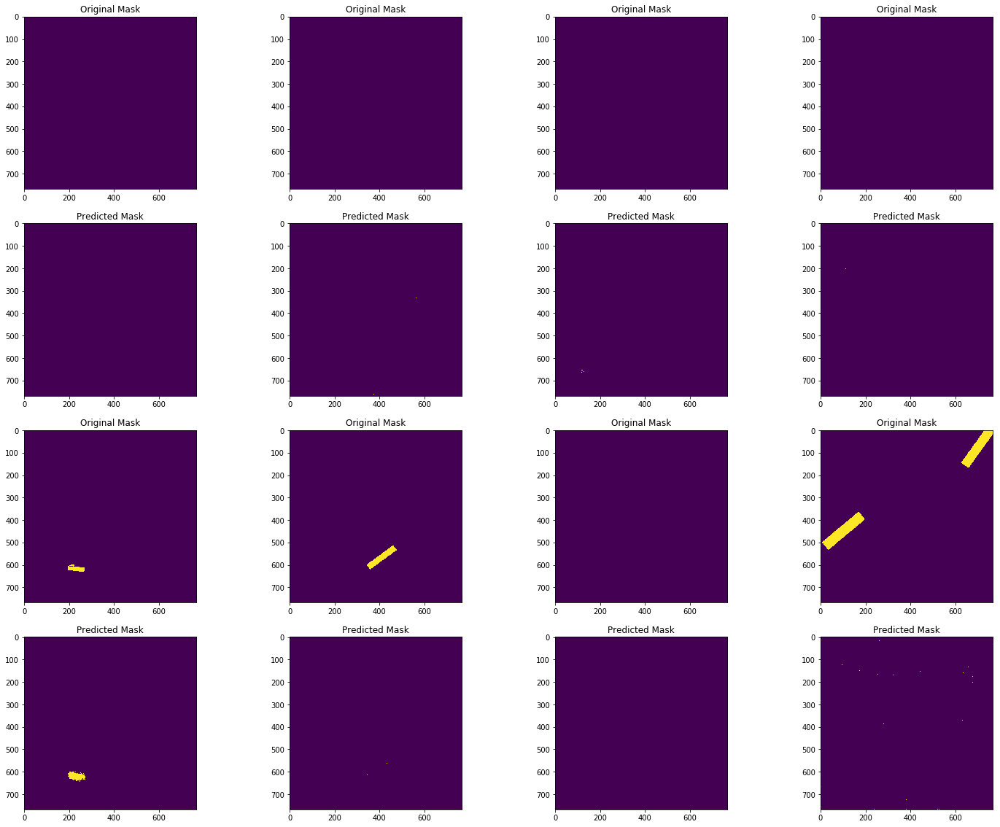

Threshold: 0.3


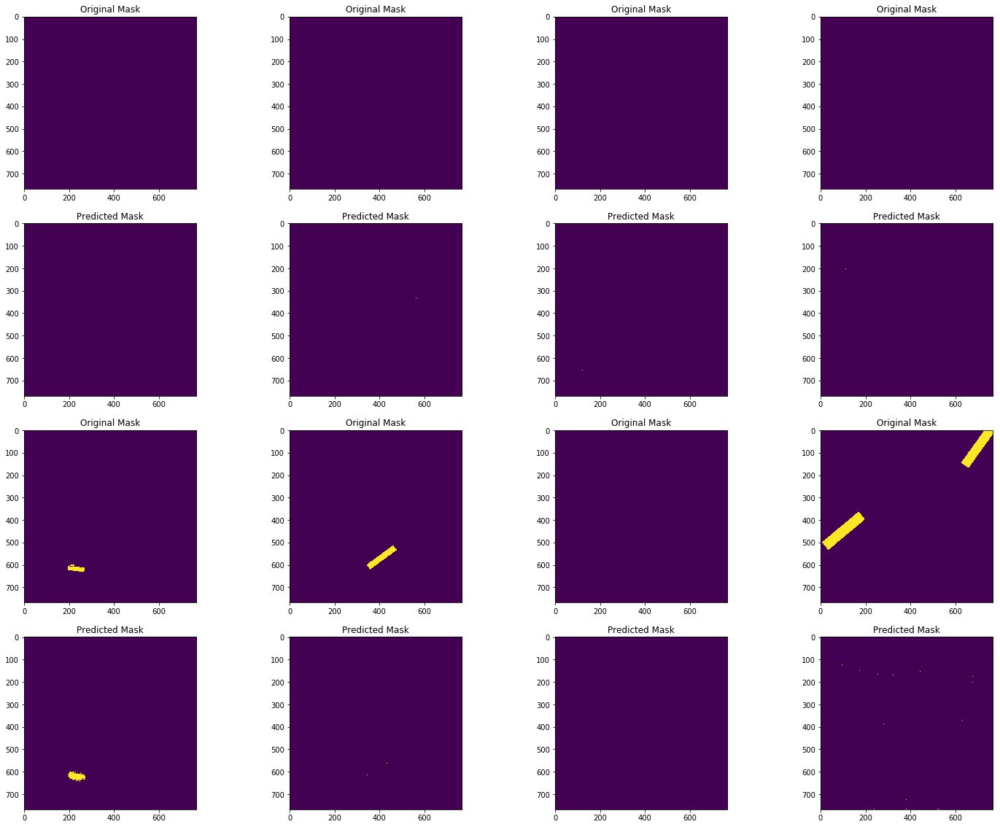

Threshold: 0.35


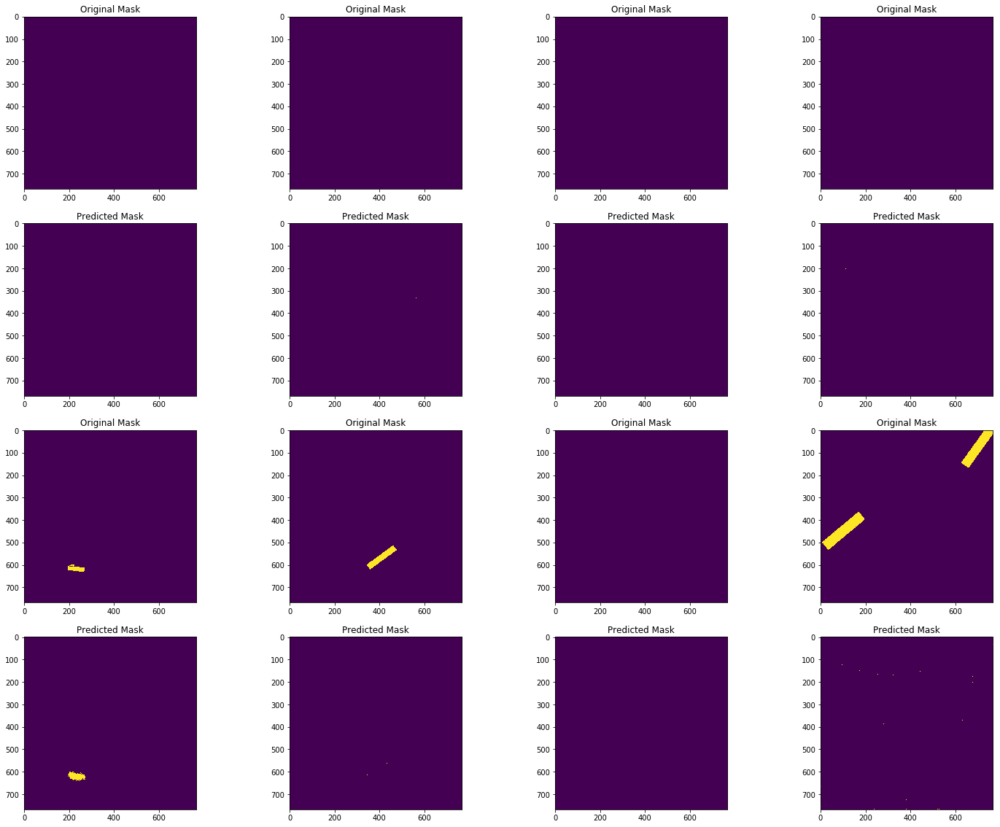

Threshold: 0.4


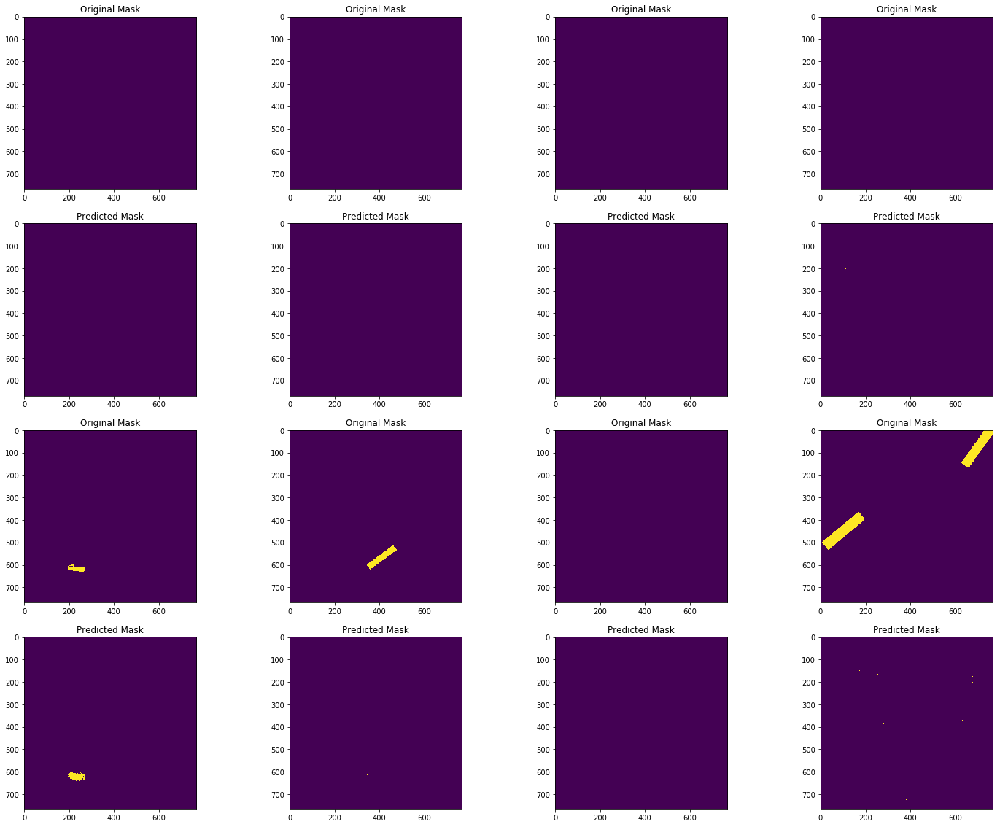

Threshold: 0.45


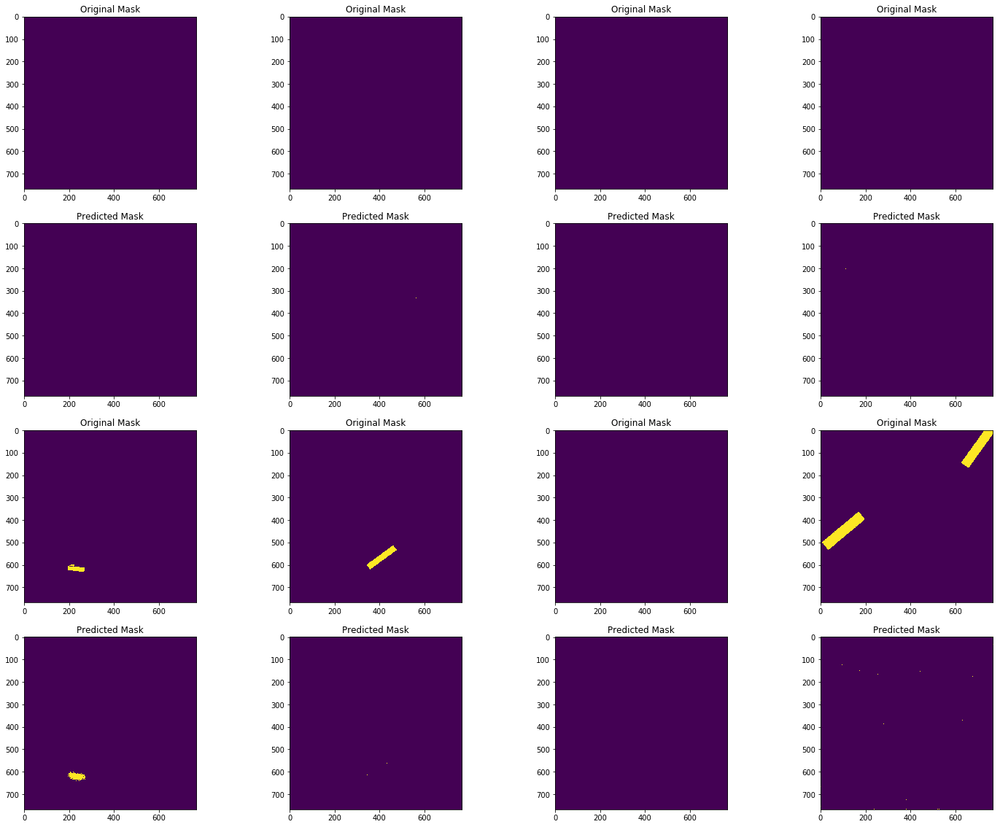

In [33]:
indices = np.array(list(range(16,24)))
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.1)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.15)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.2)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.25)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.3)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.35)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.4)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.45)

Threshold: 0.1


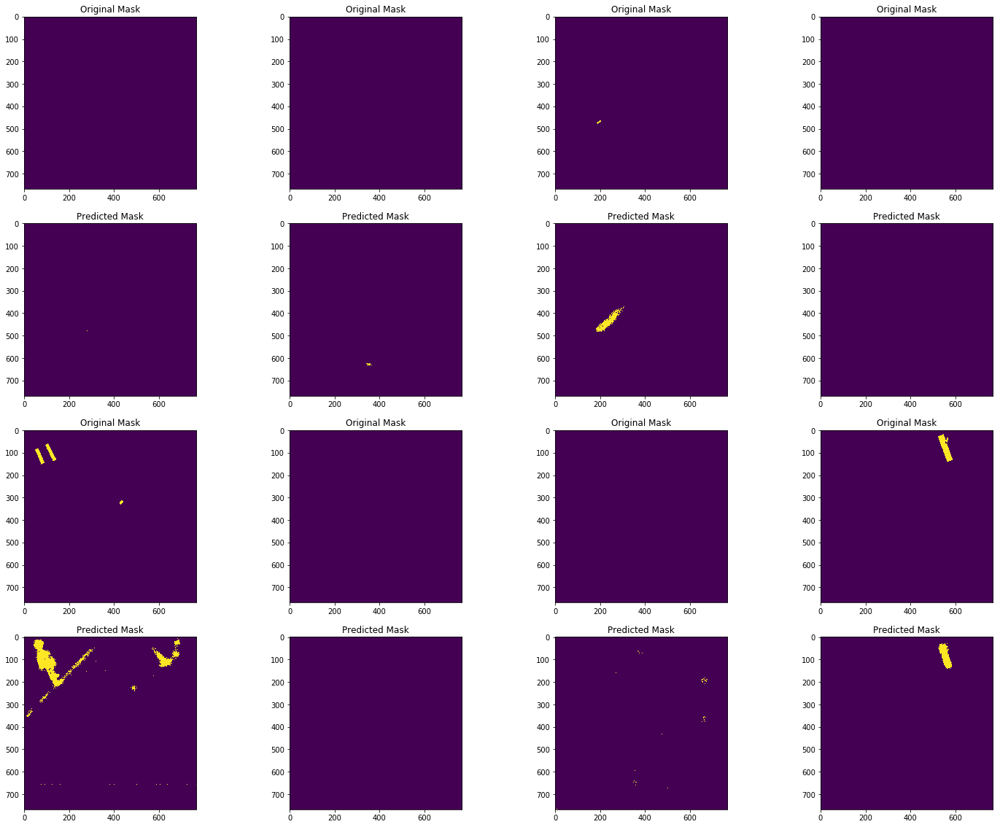

Threshold: 0.15


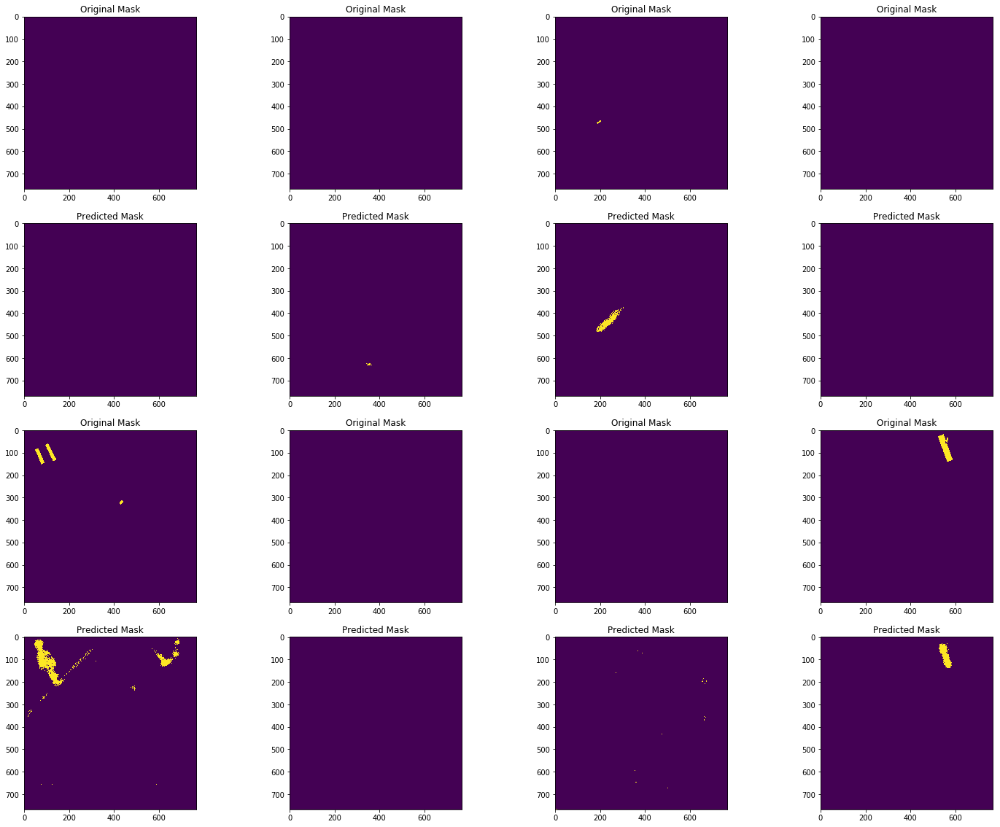

Threshold: 0.2


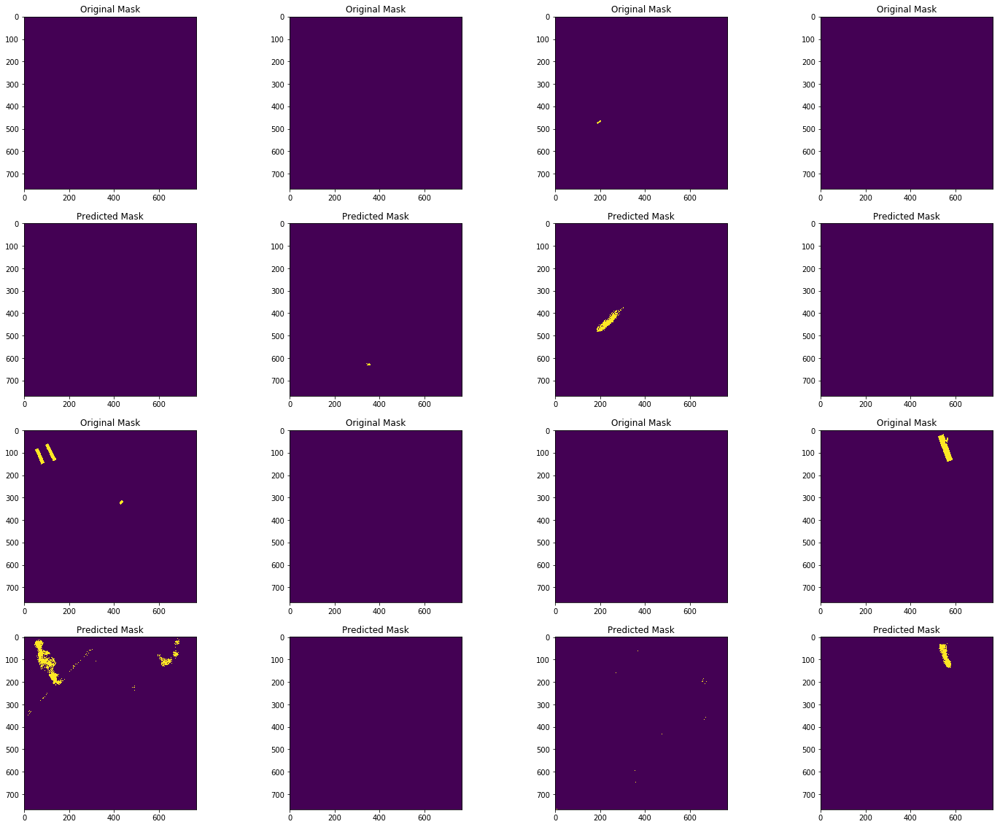

Threshold: 0.25


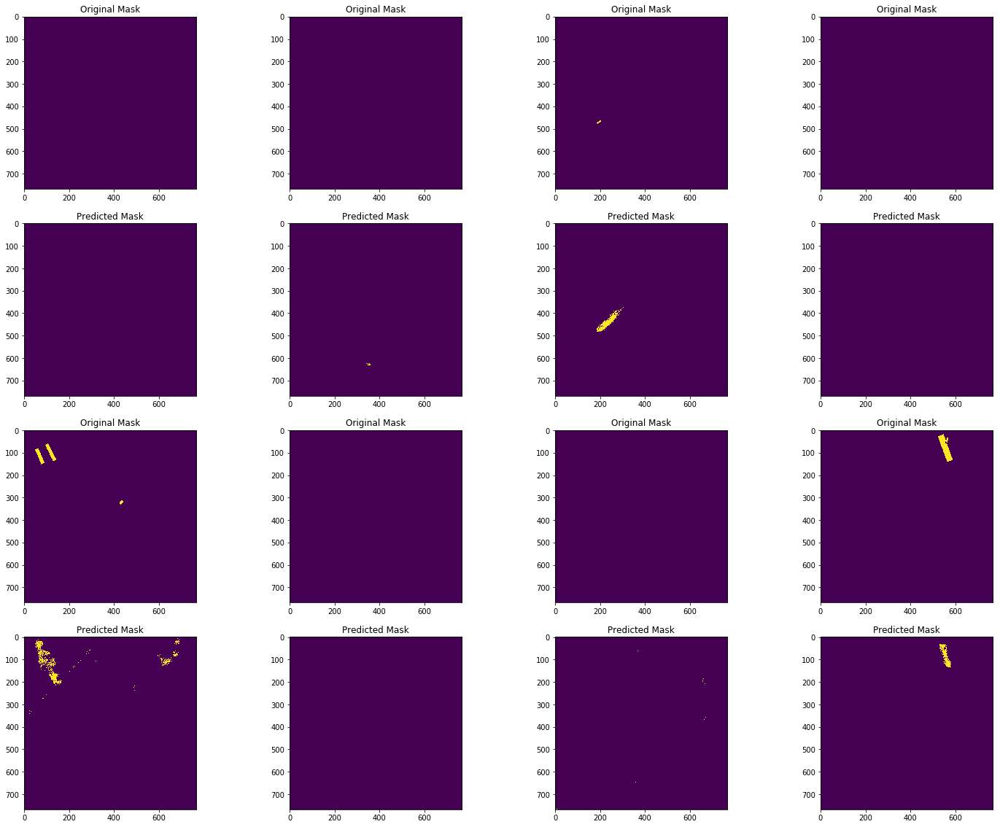

Threshold: 0.3


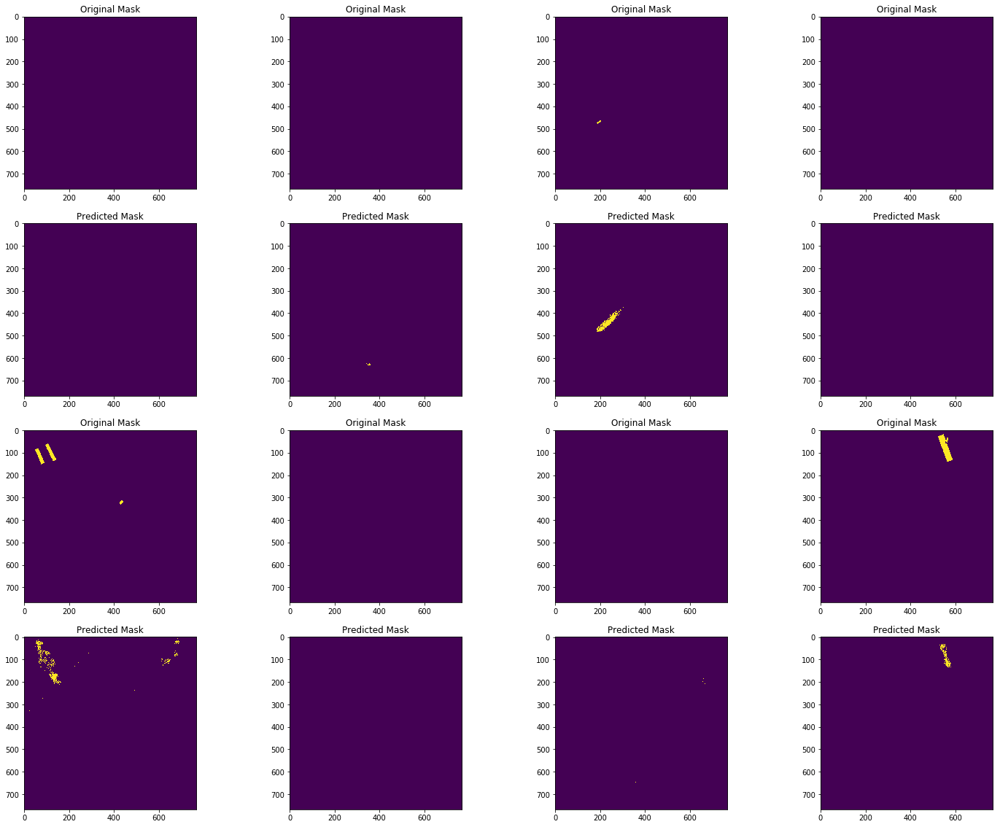

Threshold: 0.35


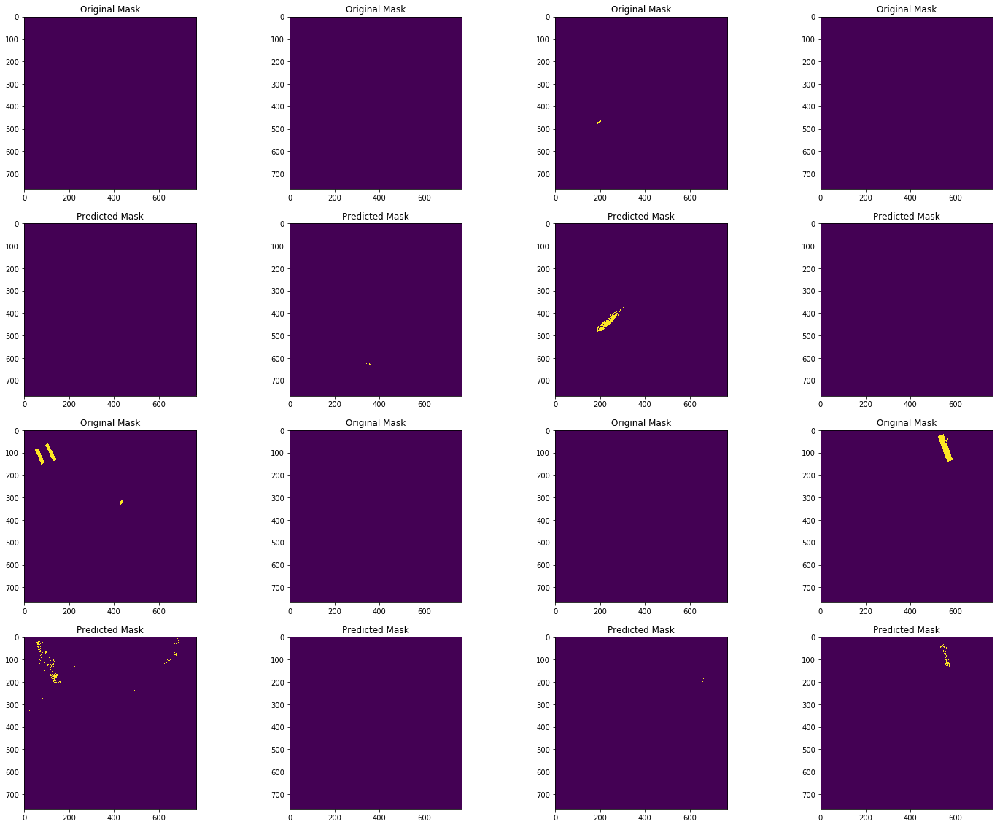

Threshold: 0.4


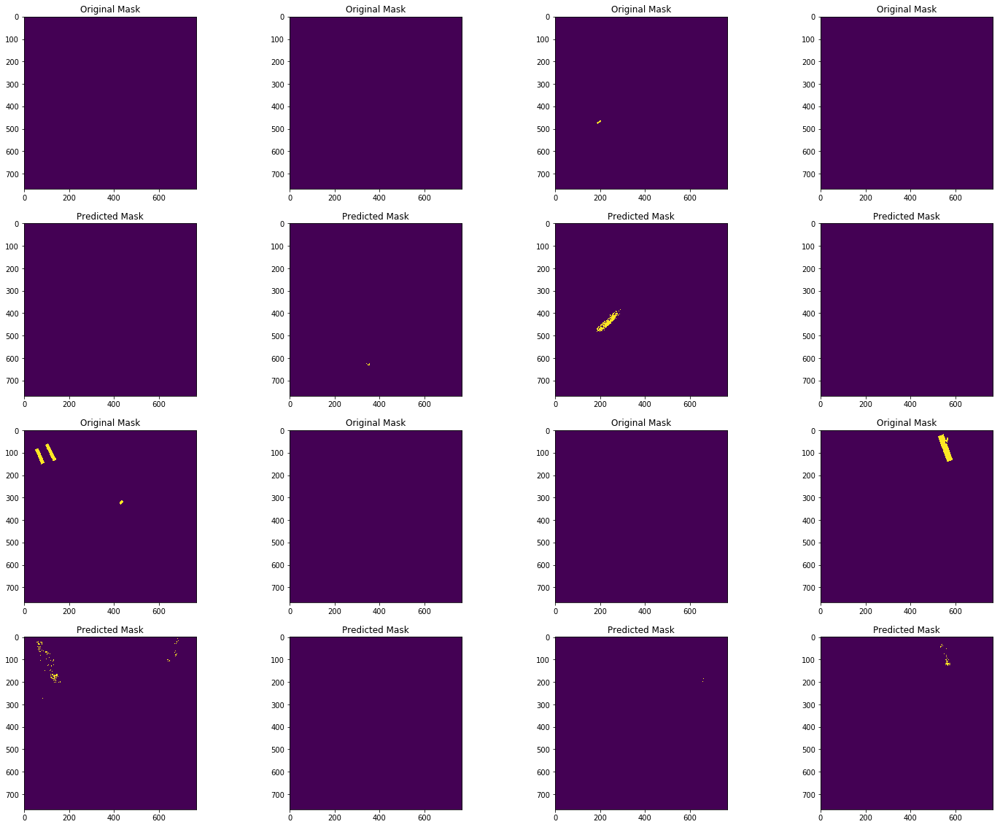

Threshold: 0.45


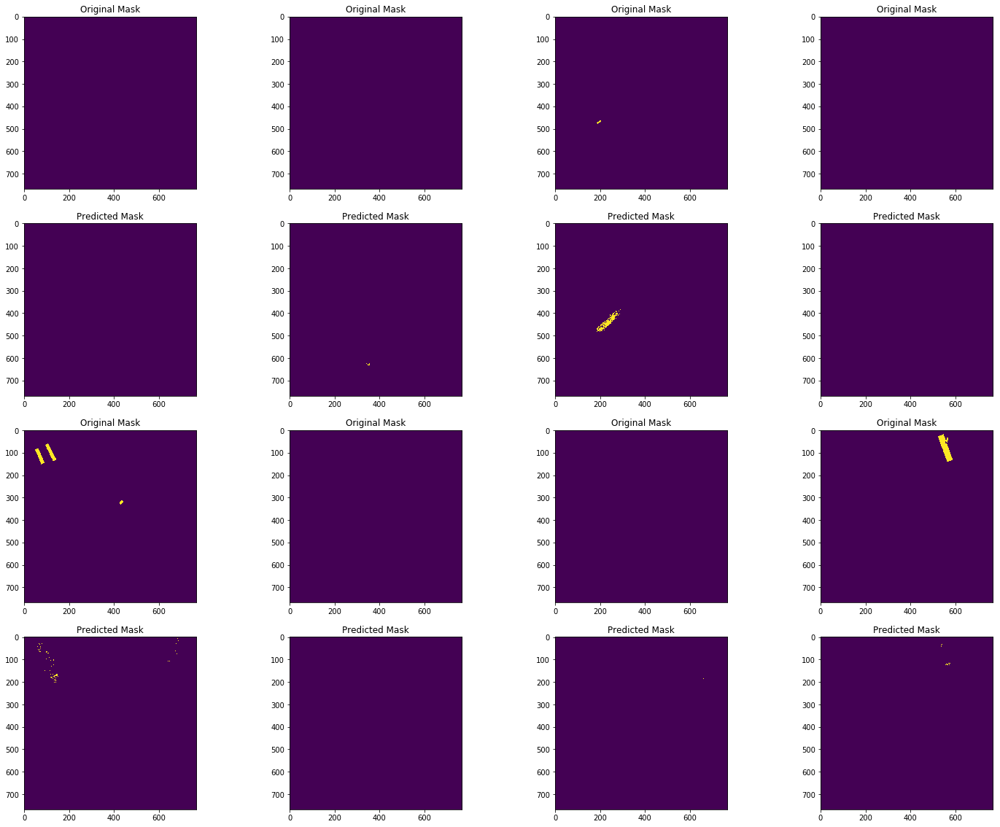

In [35]:
indices = np.array(list(range(24,32)))
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.1)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.15)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.2)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.25)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.3)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.35)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.4)
plot_masks_and_predicted_masks(mask_validation, mask_predicted, indices, 0.45)

## 6. Create and inspect submission file

Creating submission file takes a long time and compute power. There are large number of test images. So I commented out this section to save my compute time on cloud. 

**Create and save submission file**

In [37]:
# model_path = model_dir+model_name+"-"+str(best_iteration)
# submission_file = "submission.csv"
# threshold = 0.3
# n_folds = 10000
# create_predictions(model_path, X, Y_,test_ids, n_folds, 
#                    threshold, submission_dir, submission_file)

**Inspect the submission csv**

In [38]:
# submission = pd.read_csv(submission_dir+submission_file)
# submission.head(50)

In [39]:
# print(len(test_ids))
# print(submission.shape)